In [1]:
import geopandas as gpd

In [1]:
import xarray
import rioxarray as rio
import os
workingpath = 'D:/Google/My Drive/CIAT spatial_data'
datadem = [rio.open_rasterio(os.path.join(workingpath, i), chunks={'x': 1024, 'y': 1024}) for i in os.listdir(workingpath)]


In [ ]:
xrdem = xarray.concat(datadem, dim = 'band')

C:\Users\AndresAguilar\AppData\Local\Temp\ipykernel_15100\1478268446.py:1: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'x' ('x',) The recommendation is to set join explicitly for this case.
  xrdem = xarray.concat(datadem, dim = 'band')
C:\Users\AndresAguilar\AppData\Local\Temp\ipykernel_15100\1478268446.py:1: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'y' ('y',) The recommendation is to set join explicitly for this case.
  xrdem = xarray.concat(datadem, dim = 'band')


In [2]:
from rioxarray.merge import merge_arrays
xrdem_mosaic = merge_arrays(datadem)

In [ ]:
xrdem_mosaic

In [ ]:
import datetime
from rasterio.enums import Resampling
# Clean up existing attributes if necessary
xrdem_mosaic.attrs = {
    # --- STAC Common Metadata ---
    "title": "FABDEM Colombia Mosaic",
    "description": "Forest And Buildings removed Copernicus 30m DEM (FABDEM) for the territory of Colombia.",
    "created": datetime.datetime.now().isoformat(),
    "platform": "Copernicus",
    "instruments": ["SRTM", "Copernicus DEM"],  # FABDEM is derived from these
    "license": "CC-BY-4.0", # FABDEM is usually under Vexcel or CC-BY, check your source
    
    # --- STAC Project/Provider Extensions ---
    "providers": "University of Bristol",
    "source": "FABDEM (Forest And Buildings removed Copernicus 30m DEM)",
    "region": "Colombia",
    "version": "1.0",
    
    # --- Technical Info for QGIS/Plotting ---
    "units": "meters",
    "long_name": "elevation",
    "standard_name": "height_above_reference_ellipsoid",
}

if xrdem_mosaic.rio.crs is None:
    xrdem_mosaic.rio.write_crs("EPSG:4326", inplace=True)

# 2. Define the COG profile
# 'compress="deflate"' is excellent for balance between size and speed.
# 'predictor=2' or '3' helps float compression efficiency.
cog_profile = {
    "driver": "COG",
    "compress": "deflate",
    "predictor": 3,      # Optimized for floating point data
    "blocksize": 512,    # Standard tile size
    "num_threads": "all_cpus"
}

# 3. Export
output_filename = "Colombia_FABDEM_COG.tif"

xrdem_mosaic.rio.to_raster(
    output_filename,
    **cog_profile,
    tiled=True,
    windowed=True,  # Crucial for large datasets to process via chunks
    overview_resampling=Resampling.bilinear
)

print(f"Export complete: {output_filename}")

In [2]:
import os

data_countries_path = 'D:/OneDrive - CGIAR/projects/spatial_files/country/vector'
country_dict = {
    'thailand' : 'tha_admin0.shp',
    'laos': 'lao_admin0.shp',
    'cambodia': 'khm_admin0.shp',
    'vietnam': 'vnm_admin0.shp'
}


list_countries = [gpd.read_file(os.path.join(data_countries_path, k, v)) for k, v in country_dict.items()]
    

In [3]:
import pandas as pd

merged_data = pd.concat(list_countries, ignore_index= True)

In [12]:
merged_data.to_file('D:/OneDrive - CGIAR/projects/spatial_files/country/vector/southeastasia/southeastasia.shp')

c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\crop_suite\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Field valid_on create as date field, though DateTime requested.
  ogr_write(
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\crop_suite\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Field valid_to create as date field, though DateTime requested.
  ogr_write(


In [ ]:
from src.python.data_conversion import from_tabular_to_geospatial, read_csv_data
iso3_to_country = {
    'THA': 'Thailand',
    'LAO': 'Laos',
    'VNM': 'Vietnam',
    'KHM': 'Cambodia',
    'PHL': 'Philippines'
}
    
merged_data.total_bounds

input_dir1 = 'data/CWBD2.csv'
input_dir2 = 'data/CWBD_PHL.csv'


df1 = read_csv_data(input_dir1)
gs_df1 = from_tabular_to_geospatial(df1, 'longitude', 'latitude')
gs_df1 = from_tabular_to_geospatial(df1, 'longitude', 'latitude')

df2 = read_csv_data(input_dir2)
gs_df2 = from_tabular_to_geospatial(df2, 'longitude', 'latitude')


In [ ]:
gs_df2.

,collection_date,lab_code,id_disease,short_name,variety,VS,LAB,iso3,latitude,longitude,location_level_2,location_level_3,location_level_4,geometry
0,20240415,QUE-001 (A),3,CWBD,Lakan,P,NaN,PHL,12.015198,123.750750,Quezon,Real,Cawayan,POINT (123.75075 12.0152)
1,20240415,QUE-001 (B),3,CWBD,Lakan,P,NaN,PHL,12.015198,123.750750,Quezon,Real,Cawayan,POINT (123.75075 12.0152)
2,20240415,QUE-002 (A),3,CWBD,Lakan,P,NaN,PHL,14.542531,121.609593,Quezon,Real,Malapad,POINT (121.60959 14.54253)
3,20240415,QUE-002(B),3,CWBD,Lakan,P,NaN,PHL,14.542531,121.609593,Quezon,Real,Malapad,POINT (121.60959 14.54253)
4,20240415,QUE-003 (A),3,CWBD,Lakan,P,NaN,PHL,14.542531,121.609593,Quezon,Real,Malapad,POINT (121.60959 14.54253)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
730,20240402,IC4 - S2,3,CWBD,NaN,P,NaN,PHL,10.758322,122.179699,Iloilo,Igbaras,NaN,POINT (122.1797 10.75832)
731,20240402,IC4 - S3,3,CWBD,NaN,P,NaN,PHL,10.758322,122.179699,Iloilo,Igbaras,NaN,POINT (122.1797 10.75832)
732,20240402,IC4 - P1,3,CWBD,NaN,P,NaN,PHL,10.758322,122.179699,Iloilo,Igbaras,NaN,POINT (122.1797 10.75832)
733,20240402,IC4 - P2,3,CWBD,NaN,P,NaN,PHL,10.758322,122.179699,Iloilo,Igbaras,NaN,POINT (122.1797 10.75832)


In [10]:
from iso3166 import countries
        

ModuleNotFoundError: No module named 'iso3166'

In [ ]:
gs_df_proj = gpdf.to_crs('ESRI:54052')

#gs_df_proj['distance'] = gs_df_proj.geometry.distance(gs_df_proj.geometry.shift())

## extracting year

gs_df_proj['year'] = gs_df_proj['collection_date_YYYYMMDD'].apply(lambda x: int(str(x)[:4]))

## unique coordinates

gs_df_proj['unique_coordinates'] = gs_df_proj.apply(lambda x: str(x['longitude']) + '_' + str(x['latitude']), axis=1)

gs_df_proj_unique = gs_df_proj.drop_duplicates(subset=['unique_coordinates'])

In [ ]:

data_points = gpd.read_file('outputs/spatial_data/spatial_data_unique.shp')

data_points



,collection,lab_code,variety,visual_sym,lab,iso3,latitude,longitude,location_l,location_1,location_2,year,unique_coo,visual_s_1,geometry
0,20190528,Sakaeo 5-1,CMR-89,N,NaN,THA,13.881389,102.734722,\N,\N,\N,2019,102.734722_13.881389,0.0,POINT (11199905.767 1545269.155)
1,20190528,Sakaeo 7-1,CMR-89,N,NaN,THA,13.690833,102.556944,\N,\N,\N,2019,102.556944_13.690833,0.0,POINT (11187094.926 1524056.558)
2,20190528,Sakaeo 11-1,CMR-89,N,NaN,THA,13.771389,102.674444,\N,\N,\N,2019,102.674444_13.771389,0.0,POINT (11197103.434 1533024.011)
3,20190518,Sakaeo 13-1,R72,N,NaN,THA,14.016389,102.874444,\N,\N,\N,2019,102.874444_14.016389,0.0,POINT (11210397.681 1560297.286)
4,20190518,Sakaeo 14-1,CMR-89,N,NaN,THA,14.032778,102.861667,\N,\N,\N,2019,102.861667_14.032778,0.0,POINT (11208455.459 1562121.701)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1243,20220907,L10-1,\N,N,NaN,KHM,13.544132,106.680687,Ratanak Kiri,Kun mum,\N,2022,106.680687_13.544132,0.0,POINT (11638250.536 1507725.877)
1244,20220907,L13-1,\N,N,NaN,KHM,13.386342,106.059230,Stung Treng,Siembouk,\N,2022,106.05923_13.386342,0.0,POINT (11576423.753 1490160.775)
1245,20220907,L15-1,\N,N,NaN,KHM,12.572239,106.087190,Kratie,Cheut Borey,\N,2022,106.08719_12.572239,0.0,POINT (11606481.516 1399535.244)
1246,20220908,L17-1,\N,N,NaN,KHM,12.427537,105.985778,Kratie,Prek Prasob,\N,2022,105.985778_12.427537,0.0,POINT (11600086.756 1383427.091)


In [17]:
import rioxarray as rio
import xarray
import geopandas as gpd

climate_data = xarray.open_dataset(f"outputs/climate_data/weather_southeastasia_2019_2022.nc")

data_points = gpd.read_file('outputs/spatial_data/spatial_data_unique.shp')


data_points = data_points.to_crs(climate_data.rio.crs)


In [25]:
climate_data.rio.transform()

Affine(0.05000000074505806, 0.0, 96.95000412687659,
       0.0, -0.05000000074505806, 23.44999945536256)

In [26]:
import numpy as np
from shapely.geometry import box
da = climate_data.precipitation.isel(date=0)
transform = climate_data.rio.transform()
ny, nx = da.shape

polygons = []
ids = []

for row in range(ny):
    for col in range(nx):
        x_left, y_top = transform * (col, row)
        x_right, y_bottom = transform * (col + 1, row + 1)

        polygons.append(box(x_left, y_bottom, x_right, y_top))
        ids.append(row * nx + col)

grid = gpd.GeoDataFrame(
    {"cell_id": ids},
    geometry=polygons,
    crs=climate_data.rio.crs
)

In [27]:
joined = gpd.sjoin(data_points, grid, predicate="within")

In [28]:
joined

,collection,lab_code,variety,visual_sym,lab,iso3,latitude,longitude,location_l,location_1,location_2,year,unique_coo,visual_s_1,geometry,index_right,cell_id
0,20190528,Sakaeo 5-1,CMR-89,N,NaN,THA,13.881389,102.734722,\N,\N,\N,2019,102.734722_13.881389,0.0,POINT (102.73472 13.88139),49966,49966
1,20190528,Sakaeo 7-1,CMR-89,N,NaN,THA,13.690833,102.556944,\N,\N,\N,2019,102.556944_13.690833,0.0,POINT (102.55694 13.69083),51007,51007
2,20190528,Sakaeo 11-1,CMR-89,N,NaN,THA,13.771389,102.674444,\N,\N,\N,2019,102.674444_13.771389,0.0,POINT (102.67444 13.77139),50487,50487
3,20190518,Sakaeo 13-1,R72,N,NaN,THA,14.016389,102.874444,\N,\N,\N,2019,102.874444_14.016389,0.0,POINT (102.87444 14.01639),49186,49186
4,20190518,Sakaeo 14-1,CMR-89,N,NaN,THA,14.032778,102.861667,\N,\N,\N,2019,102.861667_14.032778,0.0,POINT (102.86167 14.03278),49186,49186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1243,20220907,L10-1,\N,N,NaN,KHM,13.544132,106.680687,Ratanak Kiri,Kun mum,\N,2022,106.680687_13.544132,0.0,POINT (106.68069 13.54413),51872,51872
1244,20220907,L13-1,\N,N,NaN,KHM,13.386342,106.059230,Stung Treng,Siembouk,\N,2022,106.05923_13.386342,0.0,POINT (106.05923 13.38634),52643,52643
1245,20220907,L15-1,\N,N,NaN,KHM,12.572239,106.087190,Kratie,Cheut Borey,\N,2022,106.08719_12.572239,0.0,POINT (106.08719 12.57224),56819,56819
1246,20220908,L17-1,\N,N,NaN,KHM,12.427537,105.985778,Kratie,Prek Prasob,\N,2022,105.985778_12.427537,0.0,POINT (105.98578 12.42754),57600,57600


In [32]:
cell_mean = joined.groupby("cell_id")["visual_s_1"].mean()

import numpy as np

result = np.full((ny * nx), np.nan)
result[cell_mean.index] = cell_mean.values

result = result.reshape((ny, nx))

In [41]:
mean_da

<xarray.DataArray (y: 357, x: 261)> Size: 745kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * y            (y) float64 3kB 23.42 23.37 23.32 23.27 ... 5.725 5.675 5.625
  * x            (x) float64 2kB 96.98 97.03 97.08 97.13 ... 109.9 109.9 110.0
    date         datetime64[ns] 8B 2019-01-01
    spatial_ref  int32 4B 0

In [42]:
mean_da = xarray.DataArray(
    result,
    coords=da.coords,
    dims=da.dims
)

mean_da.rio.write_crs(climate_data.rio.crs, inplace=True)

mean_da.rio.to_raster('outputs/climate_data/visual_symptoms.tif')


In [5]:
x_coords = xarray.DataArray(data_points.geometry.x, dims=["point"])
y_coords = xarray.DataArray(data_points.geometry.y, dims=["point"])

sampled_values = climate_data.sel(x=x_coords, y=y_coords, method="nearest")

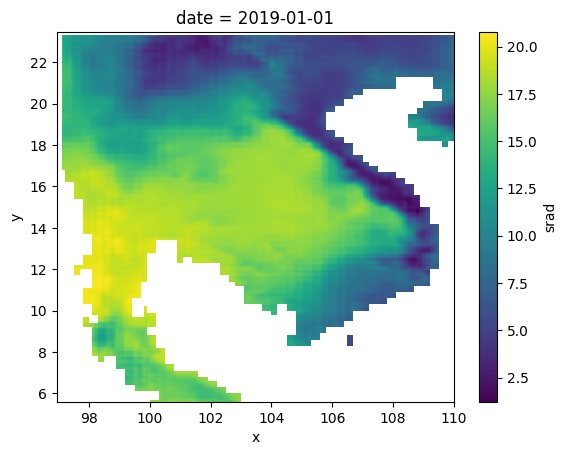

In [ ]:
climate_data.srad.isel(date = 0)

## Weather Patterns

In [1]:

### Data extraction
import xarray
import rioxarray as rio
import geopandas as gpd


climate_data = xarray.open_dataset(f"outputs/climate_data/weather_southeastasia_2019_2022.nc")
aggregated_symptoms = rio.open_rasterio("outputs/wb_evaluations/visual_symptoms.tif")

## 
coordinates_with_values = aggregated_symptoms.to_dataframe(name = 'symptoms_freq').reset_index().dropna(subset = ['symptoms_freq'])
x_da = xarray.DataArray(coordinates_with_values.x.values, dims="points")
y_da = xarray.DataArray(coordinates_with_values.y.values, dims="points")

#cl_symptoms = climate_data.sel(x = x_da, y = y_da)


In [2]:
meteo_variables= ['precipitation', 'tmin', 'tmax', 'hrmin', 'hrmax', 'srad']
datasel = climate_data[meteo_variables].to_array()

In [ ]:

x_data = datasel.sel(x = x_da, y = y_da).dropna('points').transpose("points","date","variable").values

## dataclustering using dtw

In [4]:
##scale data
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
X_scaled = TimeSeriesScalerMeanVariance().fit_transform(x_data)

In [ ]:
from tslearn.clustering import TimeSeriesKMeans

model = TimeSeriesKMeans(
    n_clusters=10,
    metric="softdtw",
    max_iter=20,
    n_jobs = 4,
    random_state=0,
    verbose = 1
)

labels = model.fit_predict(X_scaled)

### clustering summary

In [ ]:
import pandas as pd
import geopandas as gpd
import os
data_path = r'outputs\wb_evaluations\cluster_labels_nclusters20_metric_euclidean.csv'
filename = os.path.basename(data_path)
clustered_data = pd.read_csv(data_path)
clustered_gdf = gpd.GeoDataFrame(clustered_data, geometry = gpd.points_from_xy(clustered_data.x, clustered_data.y), crs='EPSG:4326')

if not os.path.exists(f'outputs/wb_evaluations/{filename[:-4]}.shp'):
    clustered_gdf.to_file(f'outputs/wb_evaluations/{filename[:-4]}.shp')
    
# categorizing disease frequency

categories = [0, 25, 50, 75, 100]
labels = ['no', 'low', 'medium', 'high']

clustered_gdf['symptoms_cat'] = pd.cut(clustered_gdf['symptoms_freq'], bins=categories, labels=labels, include_lowest=True)
clustered_gdf['symptoms'] = clustered_gdf['symptoms_freq'].apply(lambda x: 'no' if x == 0 else 'yes')
## counting the number of cluster in each category

cluster_counts_cat = clustered_gdf.groupby(['symptoms_cat', 'cluster']).size().unstack(fill_value=0) 

cluster_counts_presence = clustered_gdf.groupby(['symptoms', 'cluster']).size().unstack(fill_value=0) 

## calcualte percentage of symptoms per cluster

cluster_percentages = cluster_counts_presence.div(cluster_counts_presence.sum(axis=1), axis=0) * 100

print(cluster_percentages)

df_sum = cluster_counts_presence.sum(axis=0).reset_index()
datapd = []
for cl in range(clustered_gdf.cluster.nunique()):
    cl_size = cluster_counts_presence[cl].no + cluster_counts_presence[cl].yes
    percnocluster = (cluster_counts_presence[cl].no / cl_size)*100
    percyescluster = 100 - percnocluster
    print(f"Cluster {cl}: {percnocluster:.2f}% no symptoms, {percyescluster:.2f}% yes symptoms, cluster: {cl}")
    datapd.append(pd.DataFrame({'cluster': [cl], 'percnocluster': [percnocluster], 'percyescluster': [percyescluster], 'total_values': [cl_size]}))
    
cldf = pd.concat(datapd).sort_values('percyescluster', ascending=False)
clofinterest = cldf.cluster.values[0:3]
clofinterest_low = cldf.cluster.values[-4:-1]
print(cldf)


C:\Users\AndresAguilar\AppData\Local\Temp\ipykernel_36544\3696331034.py:10: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  clustered_gdf.to_file(f'outputs/wb_evaluations/{filename[:-4]}.shp')
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'spatial_ref' to 'spatial_re'
  ogr_write(
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'symptoms_freq' to 'symptoms_f'
  ogr_write(


## create plots

In [ ]:
import xarray

climate_data = xarray.open_dataset('outputs/climate_data/weather_southeastasia_2019_2022.nc')
if not isinstance(clofinterest, np.ndarray): list(clofinterest)
if not isinstance(clofinterest_low, np.ndarray): list(clofinterest_low)
clofinterest_data = clustered_gdf.loc[[i in clofinterest for i in clustered_gdf.cluster ]]
clofinterestlow_data = clustered_gdf.loc[[i in clofinterest_low for i in clustered_gdf.cluster ]]

x_da = xarray.DataArray(clofinterest_data.x.values, dims="points")
y_da = xarray.DataArray(clofinterest_data.y.values, dims="points")

x_low = xarray.DataArray(clofinterestlow_data.x.values, dims="points")
y_low = xarray.DataArray(clofinterestlow_data.y.values, dims="points")

meteo_variables= ['precipitation', 'tmin', 'tmax', 'hrmin', 'hrmax', 'srad']
datasel = climate_data[meteo_variables].to_array()

cl_weather_data = datasel.sel(x = x_da, y = y_da,method = 'nearest').dropna('points')
cl_weather_data_low = datasel.sel(x = x_low, y = y_low,method = 'nearest').dropna('points')


import matplotlib.pyplot as plt
import numpy as np
f, ax = plt.subplots(ncols = 1, nrows = 2, figsize = (12,6))
ax[0].plot(climate_data.date, np.mean(np.mean(cl_weather_data.values[1:3], axis = 0), axis = -1), c ='r', label = 'high incidence')
ax[0].plot(climate_data.date, np.mean(np.mean(cl_weather_data_low.values[1:3], axis = 0), axis = -1), c ='g', label = 'low incidence')
ax[0].set_title('Temperature (°C)')
ax[0].legend()
ax[1].plot(climate_data.date, np.mean(np.mean(cl_weather_data.values[3:5], axis = 0), axis = -1), c ='r', label = 'high incidence')
ax[1].plot(climate_data.date, np.mean(np.mean(cl_weather_data_low.values[3:5], axis = 0), axis = -1), c ='g', label = 'low incidence')
ax[1].set_title('Relative Humidity (%)')

In [32]:
from tqdm import tqdm
def euclidean_distance(point1, point2):
    return np.sqrt((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2)

def merge_by_distance(gpdf1, gpdf2, distance_threshold, variables_to_merge):
    if isinstance(variables_to_merge, str):
        variables_to_merge = [variables_to_merge]
        
    
    coords1= list(zip(gpdf1.geometry.x.values.astype(np.float32), gpdf1.geometry.y.values.astype(np.float32))) 
    coords2= list(zip(gpdf2.geometry.x.values.astype(np.float32), gpdf2.geometry.y.values.astype(np.float32))) 
    merged_data = []
    
    for j, co1 in tqdm(zip(gpdf1.index, coords1)):
        
        coordsperpoint = []
        for i, co2 in enumerate(coords2):
            
            dist = euclidean_distance(co1, co2)
            
            if dist<distance_threshold:
                coordsperpoint.append((i,dist))
                    

        if coordsperpoint:
            id_cloi = np.array(coordsperpoint).T[0][np.argmin(np.array(coordsperpoint).T[1])]
            datacl = gpdf2.iloc[int(id_cloi)]
            
            datassubset = gpdf1.iloc[j]
            for var in variables_to_merge:
                datassubset[var] = datacl[var]
            
            merged_data.append(datassubset)
    df_merged = pd.DataFrame(merged_data)
    return gpd.GeoDataFrame(df_merged , geometry = df_merged.geometry, crs = gpdf1.crs)


data_symptoms = gpd.read_file('outputs/spatial_data/spatial_data_unique.shp')

[i in clofinterest for i in clustered_gdf.cluster ]

clustered_gdfcloi = clustered_gdf.loc[[i in clofinterest for i in clustered_gdf.cluster ]].reset_index(drop=True)
clustered_gdfcloi_low = clustered_gdf.loc[[i in clofinterest_low for i in clustered_gdf.cluster ]].reset_index(drop=True)

clustered_gdfcloi_proj = clustered_gdfcloi.to_crs(data_symptoms.crs)
clustered_gdfcloi_proj_low = clustered_gdfcloi_low.to_crs(data_symptoms.crs)

data_symptoms_clhighest = merge_by_distance(data_symptoms, clustered_gdfcloi_proj, distance_threshold = 5000, variables_to_merge = ['cluster'])

data_symptoms_cllowest = merge_by_distance(data_symptoms, clustered_gdfcloi_proj_low, distance_threshold = 5000, variables_to_merge = ['cluster'])




1248it [00:00, 5647.80it/s]
1248it [00:00, 1473.12it/s]


In [33]:
pd.concat([data_symptoms_clhighest, data_symptoms_cllowest]).to_file('outputs/wb_evaluations/data_symptoms_clustered_mlt.shp')

## all data analysis

In [3]:
import geopandas as gpd
import pandas as pd
data_symptoms = gpd.read_file('outputs/spatial_data/spatial_data.shp')
data_clusters = gpd.read_file('outputs/wb_evaluations/data_symptoms_clustered_mlt.shp')

data_symptoms['coordsid'] = list(zip(data_symptoms.longitude.values, data_symptoms.latitude.values)) 
data_clusters['coordsid'] = list(zip(data_clusters.longitude.values, data_clusters.latitude.values)) 

dff = pd.merge(data_symptoms, data_clusters, on='coordsid', how='left').dropna(subset=['cluster'])

# get yeaer
dff['year'] = dff['collection_x'].astype(str).str[:4].astype(int)

# count symptoms per year per cluster
dff['symptoms'] = dff.visual_sym_x.apply(lambda x: 0 if x == 'N' else 1)

symptoms_per_year_cluster = dff.groupby(['year', 'cluster'])['symptoms'].sum().unstack(fill_value=0)
symptoms_per_year_cluster = dff.groupby(['year', 'cluster', 'visual_sym_x']).size().unstack(fill_value=0)

print(symptoms_per_year_cluster)

data_symptoms = gpd.read_file('outputs/spatial_data/spatial_data.shp')
data_symptoms['year'] = data_symptoms['collection'].astype(str).str[:4].astype(int)

data_symptoms = data_symptoms.groupby(['year', 'visual_sym']).size().unstack(fill_value=0)
data_symptoms

visual_sym_x     N    P
year cluster           
2014 2.0       896  354
     3.0        14   36
     5.0      1792  158
     10.0       50    0
     17.0      711  139
     19.0     1543  407
2019 5.0      1188    0
2020 2.0       870   30
     3.0      3167    1
     5.0      3120    0
     10.0      900    0
     19.0     1500    0
2021 2.0       351    9
     3.0      1714    0
     5.0       480    0
     10.0      719    0
     19.0      360    0
2022 2.0       610   50
     3.0       239    1


visual_sym,N,P
year,,
2013,60,40
2014,16262,4088
2019,1518,0
2020,28288,73
2021,16824,40
2022,10121,281
2023,180,0


In [45]:
print(clofinterest, clofinterest_low)

[ 2 17 19] [ 5  3 10]


In [39]:
data_symptoms = gpd.read_file('outputs/spatial_data/spatial_data.shp')
data_symptoms['year'] = data_symptoms['collection'].astype(str).str[:4].astype(int)

data_symptoms = data_symptoms.groupby(['collection', 'visual_sym']).size().unstack(fill_value=0)
data_symptoms

visual_sym,N,P
collection,,
20130213,60,40
20140105,50,0
20140130,88,12
20140131,285,65
20140201,925,125
...,...,...
20220907,1133,7
20220908,959,1
20220909,1200,0


In [43]:
data_symptoms = gpd.read_file('outputs/spatial_data/spatial_data_unique.shp')
data_symptoms['year'] = data_symptoms['collection'].astype(str).str[:4].astype(int)


categories = [0, 25, 50, 75, 100]
labels = ['no', 'low', 'medium', 'high']

data_symptoms['symptoms_cat'] = pd.cut(data_symptoms['visual_s_1'], bins=categories, labels=labels, include_lowest=True)
data_symptoms['symptoms'] = data_symptoms['visual_s_1'].apply(lambda x: 'no' if x == 0 else 'yes')

data_symptoms = data_symptoms.groupby(['collection', 'symptoms_cat']).size().unstack(fill_value=0)
data_symptoms

symptoms_cat,no,low,medium,high
collection,,,,
20130213,1,0,1,0
20140105,1,0,0,0
20140130,2,0,0,0
20140131,4,2,1,0
20140201,17,4,0,0
...,...,...,...,...
20220907,15,0,0,0
20220908,14,0,0,0
20220909,14,0,0,0


In [42]:
data_symptoms

symptoms_cat,no,low,medium,high
year,,,,
2013,1,0,1,0
2014,277,69,37,24
2019,45,0,0,0
2020,439,0,0,1
2021,221,0,0,0
2022,132,0,0,0
2023,1,0,0,0


In [75]:
data_clusters = gpd.read_file('outputs/wb_evaluations/data_symptoms_clustered_mlt.shp')
data_clusters.sort_values('year')


categories = [0, 25, 50, 75, 100]
labels = ['no', 'low', 'medium', 'high']

data_clusters['symptoms_cat'] = pd.cut(data_clusters['visual_s_1'], bins=categories, labels=labels, include_lowest=True)

symptoms_per_year_cluster = data_clusters.groupby(['year','cluster', 'symptoms_cat']).size().unstack(fill_value=0)

print(symptoms_per_year_cluster)



symptoms_cat  no  low  medium  high
year cluster                       
2014 2        15    5       2     3
     3         0    0       1     0
     5        32    5       2     0
     10        1    0       0     0
     17       14    1       2     0
     19       28    8       2     1
2019 5        35    0       0     0
2020 2        15    0       0     0
     3        50    0       0     0
     5        52    0       0     0
     10       15    0       0     0
     19       19    0       0     0
2021 2         2    0       0     0
     3        16    0       0     0
     5         8    0       0     0
     10       12    0       0     0
     19        4    0       0     0
2022 2         4    0       0     0
     3         4    0       0     0


In [54]:
data_clusters

,collection,lab_code,variety,visual_sym,lab,iso3,latitude,longitude,location_l,location_1,location_2,year,unique_coo,visual_s_1,cluster,geometry,symptoms_cat
0,20200608,F7-S1,\N,N,NaN,LAO,18.541950,104.482600,Bolikhamxai,Phongthong,Vanghin,2020,104.4826_18.54195,1.666667,2,POINT (11200554.033 2064080.432),no
1,20200608,F8-S1,\N,N,NaN,LAO,18.570430,104.388890,Bolikhamxai,Viengthong,Nondo,2020,104.38889_18.57043,0.000000,2,POINT (11189353.867 2067250.811),no
2,20200608,F9-S1,\N,N,NaN,LAO,18.433010,104.516830,Bolikhamxai,Viengthong,Namkang,2020,104.51683_18.43301,9.583333,2,POINT (11209168.003 2051953.287),no
3,20200609,F10-S1,\N,N,NaN,LAO,18.108200,104.971210,Bolikhamxai,Khamkred,Somkaoun,2020,104.97121_18.1082,5.000000,2,POINT (11271986.811 2015795.603),no
4,20200609,F11s1,\N,N,NaN,LAO,18.079600,104.993200,Bolikhamxai,Khamkerd,Phonthong,2020,104.9932_18.0796,2.500000,2,POINT (11275607.69 2012611.866),no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353,20211215,F94-1,Cassava,N,NaN,KHM,12.424514,103.840792,Pursat,Phnom krovanh,\N,2021,103.840792_12.424514,0.000000,5,POINT (11366996.162 1383090.572),no
354,20220906,L5-1,\N,N,NaN,KHM,12.567323,107.388215,Mondulkiri,Pech Chreada,\N,2022,107.388215_12.567323,1.666667,3,POINT (11747999.147 1398987.997),no
355,20220906,L6-1,\N,N,NaN,KHM,12.570168,107.398017,Mondulkiri,Pech Chreada,\N,2022,107.398017_12.570168,0.000000,3,POINT (11748971.059 1399304.701),no
356,20220906,L7-1,\N,N,NaN,KHM,13.674814,107.274157,Ratanak Kiri,Ou yadav,\N,2022,107.274157_13.674814,0.000000,3,POINT (11697861.405 1522273.331),no


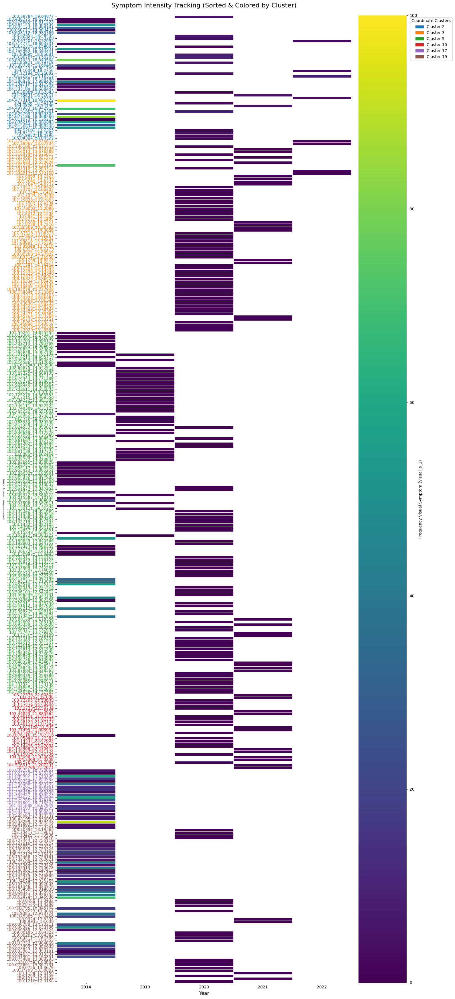

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

# 1. Map each coordinate to its cluster
# Assuming each coordinate belongs to one fixed cluster
coord_to_cluster = data_clusters.drop_duplicates(subset=['unique_coo'])[['unique_coo', 'cluster']].set_index('unique_coo')

# 2. Create the base heatmap data (Pivot Table)
heatmap_data = data_clusters.pivot_table(
    index='unique_coo', 
    columns='year', 
    values='visual_s_1', 
    aggfunc='mean'
)

# 3. Sort the Heatmap Data by Cluster
# Merge the cluster info temporarily so we can sort by it
heatmap_data = heatmap_data.join(coord_to_cluster)
# Sort rows by cluster, then by coordinate name
heatmap_data = heatmap_data.sort_values(by=['cluster', 'unique_coo'])
# Drop the 'cluster' column so it doesn't get plotted as a year
heatmap_data = heatmap_data.drop(columns=['cluster'])

# 4. Generate colors for the clusters
unique_clusters = coord_to_cluster['cluster'].dropna().unique()
unique_clusters.sort() # Sort clusters logically (e.g., 0, 1, 2)

# Get a color palette with enough colors for your clusters
palette = sns.color_palette("tab10", n_colors=len(unique_clusters))
cluster_color_map = {cluster: palette[i] for i, cluster in enumerate(unique_clusters)}

# 5. Plot the Heatmap
plt.figure(figsize=(16,35)) # Make it tall enough to read coordinates
ax = sns.heatmap(
    heatmap_data, 
    cmap='viridis', 
    linewidths=0.5, 
    yticklabels=True,  # <--- THIS IS THE FIX
    cbar_kws={'label': 'Frequency Visual Symptom (visual_s_1)', 'pad': 0.02}
)

# 6. Color the Y-axis labels based on their Cluster
for tick_label in ax.get_yticklabels():
    coord_name = tick_label.get_text()
    # Find the cluster for this coordinate
    cluster_val = coord_to_cluster.loc[coord_name, 'cluster']
    # Get the color and apply it
    label_color = cluster_color_map.get(cluster_val, 'black') # Default black if missing
    tick_label.set_color(label_color)
    

# 7. Add a custom legend for the Y-axis label colors
# Create a list of 'patches' (colored boxes) for the legend
legend_patches = [
    mpatches.Patch(color=cluster_color_map[c], label=f'Cluster {c}') 
    for c in unique_clusters
]
# Place the legend outside the plot, on the upper right
plt.legend(
    handles=legend_patches, 
    title='Coordinate Clusters', 
    bbox_to_anchor=(1.35, 1), 
    loc='upper right',
    frameon=True
)

# Customize titles
plt.title('Symptom Intensity Tracking (Sorted & Colored by Cluster)', fontsize=16, pad=20)
plt.ylabel('Unique Coordinates (Colored by Cluster)', fontsize=5)
plt.xlabel('Year', fontsize=12)

# Fix layout so nothing gets cut off
plt.tight_layout()

# Show the plot
plt.show()

## 2013 and 2014 only

In [1]:
import pandas as pd
import geopandas as gpd
import os
data_path = r'outputs\wb_evaluations\cluster_labels_nclusters15_metric_euclidean_2013_2014.csv'
filename = os.path.basename(data_path)
clustered_data = pd.read_csv(data_path)
clustered_gdf = gpd.GeoDataFrame(clustered_data, geometry = gpd.points_from_xy(clustered_data.x, clustered_data.y), crs='EPSG:4326')

if not os.path.exists(f'outputs/wb_evaluations/{filename[:-4]}.shp'):
    clustered_gdf.to_file(f'outputs/wb_evaluations/{filename[:-4]}.shp')
    
# categorizing disease frequency

categories = [0, 25, 50, 75, 100]
labels = ['no', 'low', 'medium', 'high']

clustered_gdf['symptoms_cat'] = pd.cut(clustered_gdf['symptoms_freq'], bins=categories, labels=labels, include_lowest=True)
clustered_gdf['symptoms'] = clustered_gdf['symptoms_freq'].apply(lambda x: 'no' if x == 0 else 'yes')
## counting the number of cluster in each category

cluster_counts_cat = clustered_gdf.groupby(['symptoms_cat', 'cluster']).size().unstack(fill_value=0) 

cluster_counts_presence = clustered_gdf.groupby(['symptoms', 'cluster']).size().unstack(fill_value=0) 

## calcualte percentage of symptoms per cluster

cluster_percentages = cluster_counts_presence.div(cluster_counts_presence.sum(axis=1), axis=0) * 100

print(cluster_percentages)

df_sum = cluster_counts_presence.sum(axis=0).reset_index()
datapd = []
for cl in range(clustered_gdf.cluster.nunique()):
    cl_size = cluster_counts_presence[cl].no + cluster_counts_presence[cl].yes
    percnocluster = (cluster_counts_presence[cl].no / cl_size)*100
    percyescluster = 100 - percnocluster
    print(f"Cluster {cl}: {percnocluster:.2f}% no symptoms, {percyescluster:.2f}% yes symptoms, cluster: {cl}")
    datapd.append(pd.DataFrame({'cluster': [cl], 'percnocluster': [percnocluster], 'percyescluster': [percyescluster], 'total_values': [cl_size]}))
    
cldf = pd.concat(datapd).sort_values('percyescluster', ascending=False)
clofinterest = cldf.cluster.values[0:3]
clofinterest_low = cldf.cluster.values[-4:-1]
print(cldf)


cluster         0         1          2          3         4          5   \
symptoms                                                                  
no        2.325581   0.00000  10.852713  24.031008  7.751938  10.077519   
yes       8.837209  12.55814   4.186047   5.581395  4.186047  15.813953   

cluster         6          7         8          9          10        11  \
symptoms                                                                  
no        8.527132   0.775194  3.875969   3.100775   1.550388  7.751938   
yes       7.441860  10.232558  6.046512  10.232558  10.697674  0.000000   

cluster          12        13        14  
symptoms                                 
no        11.627907  3.100775  4.651163  
yes        2.790698  0.000000  1.395349  
Cluster 0: 13.64% no symptoms, 86.36% yes symptoms, cluster: 0
Cluster 1: 0.00% no symptoms, 100.00% yes symptoms, cluster: 1
Cluster 2: 60.87% no symptoms, 39.13% yes symptoms, cluster: 2
Cluster 3: 72.09% no symptoms, 27.91% yes

Text(0.5, 1.0, 'Relative Humidity (%)')

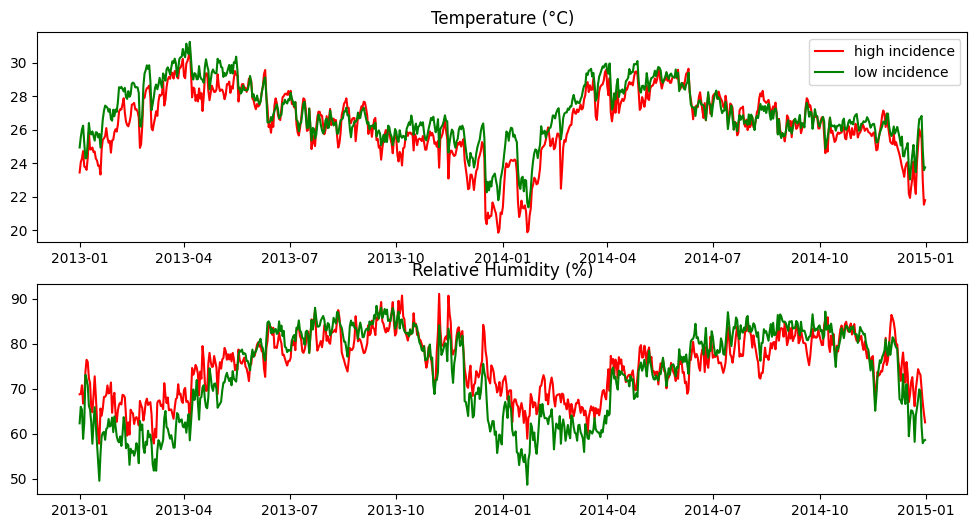

In [3]:
import xarray
import matplotlib.pyplot as plt
import numpy as np

climate_data = xarray.open_dataset('outputs/climate_data/weather_southeastasia_2013_2014.nc')
if not isinstance(clofinterest, np.ndarray): list(clofinterest)
if not isinstance(clofinterest_low, np.ndarray): list(clofinterest_low)
clofinterest_data = clustered_gdf.loc[[i in clofinterest for i in clustered_gdf.cluster ]]
clofinterestlow_data = clustered_gdf.loc[[i in clofinterest_low for i in clustered_gdf.cluster ]]

x_da = xarray.DataArray(clofinterest_data.x.values, dims="points")
y_da = xarray.DataArray(clofinterest_data.y.values, dims="points")

x_low = xarray.DataArray(clofinterestlow_data.x.values, dims="points")
y_low = xarray.DataArray(clofinterestlow_data.y.values, dims="points")

meteo_variables= ['precipitation', 'tmin', 'tmax', 'hrmin', 'hrmax', 'srad']
datasel = climate_data[meteo_variables].to_array()

cl_weather_data = datasel.sel(x = x_da, y = y_da,method = 'nearest').dropna('points')
cl_weather_data_low = datasel.sel(x = x_low, y = y_low,method = 'nearest').dropna('points')



f, ax = plt.subplots(ncols = 1, nrows = 2, figsize = (12,6))
ax[0].plot(climate_data.date, np.mean(np.mean(cl_weather_data.values[1:3], axis = 0), axis = -1), c ='r', label = 'high incidence')
ax[0].plot(climate_data.date, np.mean(np.mean(cl_weather_data_low.values[1:3], axis = 0), axis = -1), c ='g', label = 'low incidence')
ax[0].set_title('Temperature (°C)')
ax[0].legend()
ax[1].plot(climate_data.date, np.mean(np.mean(cl_weather_data.values[3:5], axis = 0), axis = -1), c ='r', label = 'high incidence')
ax[1].plot(climate_data.date, np.mean(np.mean(cl_weather_data_low.values[3:5], axis = 0), axis = -1), c ='g', label = 'low incidence')
ax[1].set_title('Relative Humidity (%)')

In [13]:
cl_weather_data

<xarray.DataArray (variable: 6, date: 730, points: 75)> Size: 3MB
array([[[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         2.79587567e-01, 4.85493481e-01, 4.04811744e-03],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         2.79587567e-01, 4.85493481e-01, 4.04811744e-03],
        [2.35704088e+00, 9.00806785e-02, 5.92469931e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        ...,
        [3.23175850e+01, 6.93822000e-03, 7.65034819e+00, ...,
         2.44667917e-01, 0.00000000e+00, 0.00000000e+00],
        [3.23175850e+01, 6.93822000e-03, 7.65034819e+00, ...,
         2.44667917e-01, 0.00000000e+00, 0.00000000e+00],
        [3.23175850e+01, 6.93822000e-03, 7.65034819e+00, ...,
         2.44667917e-01, 0.00000000e+00, 0.00000000e+00]],

       [[1.82939818e+01, 1.92241667e+01, 1.70439208e+01, ...,
         2.07583707e+01, 2.10436676e+01, 2.13227727e+01],
        [1.88060675e+01, 1.95040683e+01, 1.76457655e+01, ...,
         2.09640477e+01, 2.13665374e+01, 2.17328369e+01],
        [1.97379765e+01, 2.06073471e+01, 1.76611116e+01, ...,
         2.16705713e+01, 2.20004726e+01, 2.23709797e+01],
...
         7.24948980e+01, 6.89728870e+01, 7.04443243e+01],
        [8.22619043e+01, 7.57738907e+01, 8.80542186e+01, ...,
         7.27808379e+01, 6.89835592e+01, 6.97509167e+01],
        [9.06187396e+01, 6.88553572e+01, 9.77018560e+01, ...,
         6.68743389e+01, 6.18063508e+01, 6.66161118e+01]],

       [[7.77454800e+00, 1.98578510e+01, 9.13327639e+00, ...,
         1.94716409e+01, 1.93821821e+01, 1.91105326e+01],
        [1.07959126e+01, 1.90040803e+01, 1.12578688e+01, ...,
         1.85796412e+01, 1.86902204e+01, 1.92235495e+01],
        [7.21587284e+00, 1.88594843e+01, 7.39285925e+00, ...,
         1.87496440e+01, 1.88324589e+01, 1.87067806e+01],
        ...,
        [1.24778675e+01, 1.87029086e+01, 1.30500855e+01, ...,
         1.89571739e+01, 1.83822644e+01, 1.88794773e+01],
        [1.16229267e+01, 1.88781681e+01, 1.34809086e+01, ...,
         1.63962072e+01, 1.58766338e+01, 1.60416560e+01],
        [1.22091145e+01, 1.95766093e+01, 1.33097824e+01, ...,
         1.99617190e+01, 1.99430278e+01, 2.00729968e+01]]],
      shape=(6, 730, 75))
Coordinates:
  * variable  (variable) object 48B 'precipitation' 'tmin' ... 'hrmax' 'srad'
  * date      (date) datetime64[ns] 6kB 2013-01-01 2013-01-02 ... 2014-12-31
    y         (points) float64 600B 13.42 13.32 13.32 ... 12.12 12.02 11.87
    x         (points) float64 600B 109.0 106.3 108.9 ... 105.5 105.1 105.2
Dimensions without coordinates: points
Attributes:
    width:      261
    height:     357
    transform:  [ 5.00000007e-02  0.00000000e+00  9.69500041e+01  0.00000000e...
    crs:        EPSG:4326

In [7]:
from tqdm import tqdm
def euclidean_distance(point1, point2):
    return np.sqrt((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2)

def merge_by_distance(gpdf1, gpdf2, distance_threshold, variables_to_merge):
    if isinstance(variables_to_merge, str):
        variables_to_merge = [variables_to_merge]
        
    
    coords1= list(zip(gpdf1.geometry.x.values.astype(np.float32), gpdf1.geometry.y.values.astype(np.float32))) 
    coords2= list(zip(gpdf2.geometry.x.values.astype(np.float32), gpdf2.geometry.y.values.astype(np.float32))) 
    merged_data = []
    gpdf1.reset_index(inplace=True)
    for j, co1 in tqdm(zip(gpdf1.index, coords1)):
        
        coordsperpoint = []
        for i, co2 in enumerate(coords2):
            
            dist = euclidean_distance(co1, co2)
            
            if dist<distance_threshold:
                coordsperpoint.append((i,dist))
                    

        if coordsperpoint:
            id_cloi = np.array(coordsperpoint).T[0][np.argmin(np.array(coordsperpoint).T[1])]
            datacl = gpdf2.iloc[int(id_cloi)]
            
            datassubset = gpdf1.iloc[j]
            for var in variables_to_merge:
                datassubset[var] = datacl[var]
            
            merged_data.append(datassubset)
    df_merged = pd.DataFrame(merged_data)
    return gpd.GeoDataFrame(df_merged , geometry = df_merged.geometry, crs = gpdf1.crs)


data_symptoms = gpd.read_file('outputs/spatial_data/spatial_data_unique.shp')

data_symptoms['year'] = data_symptoms['collection'].astype(str).str[:4].astype(int)
    
data_symptoms = data_symptoms.loc[data_symptoms.year == 2014]
    
[i in clofinterest for i in clustered_gdf.cluster ]

clustered_gdfcloi = clustered_gdf.loc[[i in clofinterest for i in clustered_gdf.cluster ]].reset_index(drop=True)
clustered_gdfcloi_low = clustered_gdf.loc[[i in clofinterest_low for i in clustered_gdf.cluster ]].reset_index(drop=True)

clustered_gdfcloi_proj = clustered_gdfcloi.to_crs(data_symptoms.crs)
clustered_gdfcloi_proj_low = clustered_gdfcloi_low.to_crs(data_symptoms.crs)

data_symptoms_clhighest = merge_by_distance(data_symptoms, clustered_gdfcloi_proj, distance_threshold = 5000, variables_to_merge = ['cluster'])

data_symptoms_cllowest = merge_by_distance(data_symptoms, clustered_gdfcloi_proj_low, distance_threshold = 5000, variables_to_merge = ['cluster'])

pd.concat([data_symptoms_clhighest, data_symptoms_cllowest]).to_file('outputs/wb_evaluations/data_symptoms_clustered_mlt_2013_2014.shp')


407it [00:00, 3015.87it/s]
407it [00:00, 3879.02it/s]


In [9]:
print(clofinterest, clofinterest_low)

[ 1  7 10] [12  3 11]


In [8]:

data_symptoms = gpd.read_file('outputs/spatial_data/spatial_data.shp')
data_symptoms['year'] = data_symptoms['collection'].astype(str).str[:4].astype(int)
data_symptoms = data_symptoms.loc[data_symptoms.year.isin([2013, 2014])]
data_clusters = gpd.read_file('outputs/wb_evaluations/data_symptoms_clustered_mlt_2013_2014.shp')

data_symptoms['coordsid'] = list(zip(data_symptoms.longitude.values, data_symptoms.latitude.values)) 
data_clusters['coordsid'] = list(zip(data_clusters.longitude.values, data_clusters.latitude.values)) 

dff = pd.merge(data_symptoms, data_clusters, on='coordsid', how='left').dropna(subset=['cluster'])

# get yeaer
dff['year'] = dff['collection_x'].astype(str).str[:4].astype(int)

# count symptoms per year per cluster
dff['symptoms'] = dff.visual_sym_x.apply(lambda x: 0 if x == 'N' else 1)

symptoms_per_year_cluster = dff.groupby(['year', 'cluster'])['symptoms'].sum().unstack(fill_value=0)
symptoms_per_year_cluster = dff.groupby(['year', 'cluster', 'visual_sym_x']).size().unstack(fill_value=0)

print(symptoms_per_year_cluster)

data_symptoms = gpd.read_file('outputs/spatial_data/spatial_data.shp')
data_symptoms['year'] = data_symptoms['collection'].astype(str).str[:4].astype(int)

data_symptoms = data_symptoms.groupby(['year', 'visual_sym']).size().unstack(fill_value=0)
data_symptoms

visual_sym_x     N    P
year cluster           
2014 1.0       811  889
     3.0      2243  207
     7.0      1543  407
     10.0      892  558
     11.0      500    0
     12.0     1020   30


visual_sym,N,P
year,,
2013,60,40
2014,16262,4088
2019,1518,0
2020,28288,73
2021,16824,40
2022,10121,281
2023,180,0


symptoms_cat   no  low  medium  high
year                                
2014          277   69      37    24


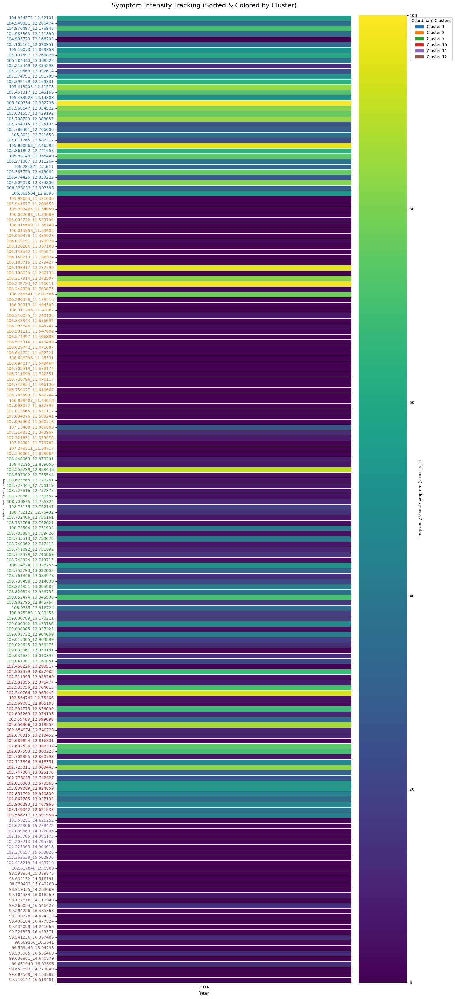

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
data_symptoms = gpd.read_file('outputs/spatial_data/spatial_data_unique.shp')
data_symptoms['year'] = data_symptoms['collection'].astype(str).str[:4].astype(int)
data_symptoms = data_symptoms[data_symptoms['year'] == 2014]

categories = [0, 25, 50, 75, 100]
labels = ['no', 'low', 'medium', 'high']

data_symptoms['symptoms_cat'] = pd.cut(data_symptoms['visual_s_1'], bins=categories, labels=labels, include_lowest=True)
data_symptoms['symptoms'] = data_symptoms['visual_s_1'].apply(lambda x: 'no' if x == 0 else 'yes')

data_symptoms = data_symptoms.groupby(['year', 'symptoms_cat']).size().unstack(fill_value=0)
print(data_symptoms)
# 1. Map each coordinate to its cluster
# Assuming each coordinate belongs to one fixed cluster
coord_to_cluster = data_clusters.drop_duplicates(subset=['unique_coo'])[['unique_coo', 'cluster']].set_index('unique_coo')

# 2. Create the base heatmap data (Pivot Table)
heatmap_data = data_clusters.pivot_table(
    index='unique_coo', 
    columns='year', 
    values='visual_s_1', 
    aggfunc='mean'
)

# 3. Sort the Heatmap Data by Cluster
# Merge the cluster info temporarily so we can sort by it
heatmap_data = heatmap_data.join(coord_to_cluster)
# Sort rows by cluster, then by coordinate name
heatmap_data = heatmap_data.sort_values(by=['cluster', 'unique_coo'])
# Drop the 'cluster' column so it doesn't get plotted as a year
heatmap_data = heatmap_data.drop(columns=['cluster'])

# 4. Generate colors for the clusters
unique_clusters = coord_to_cluster['cluster'].dropna().unique()
unique_clusters.sort() # Sort clusters logically (e.g., 0, 1, 2)

# Get a color palette with enough colors for your clusters
palette = sns.color_palette("tab10", n_colors=len(unique_clusters))
cluster_color_map = {cluster: palette[i] for i, cluster in enumerate(unique_clusters)}

# 5. Plot the Heatmap
plt.figure(figsize=(16,35)) # Make it tall enough to read coordinates
ax = sns.heatmap(
    heatmap_data, 
    cmap='viridis', 
    linewidths=0.5, 
    yticklabels=True,  # <--- THIS IS THE FIX
    cbar_kws={'label': 'Frequency Visual Symptom (visual_s_1)', 'pad': 0.02}
)

# 6. Color the Y-axis labels based on their Cluster
for tick_label in ax.get_yticklabels():
    coord_name = tick_label.get_text()
    # Find the cluster for this coordinate
    cluster_val = coord_to_cluster.loc[coord_name, 'cluster']
    # Get the color and apply it
    label_color = cluster_color_map.get(cluster_val, 'black') # Default black if missing
    tick_label.set_color(label_color)
    

# 7. Add a custom legend for the Y-axis label colors
# Create a list of 'patches' (colored boxes) for the legend
legend_patches = [
    mpatches.Patch(color=cluster_color_map[c], label=f'Cluster {c}') 
    for c in unique_clusters
]
# Place the legend outside the plot, on the upper right
plt.legend(
    handles=legend_patches, 
    title='Coordinate Clusters', 
    bbox_to_anchor=(1.35, 1), 
    loc='upper right',
    frameon=True
)

# Customize titles
plt.title('Symptom Intensity Tracking (Sorted & Colored by Cluster)', fontsize=16, pad=20)
plt.ylabel('Unique Coordinates (Colored by Cluster)', fontsize=5)
plt.xlabel('Year', fontsize=12)

# Fix layout so nothing gets cut off
plt.tight_layout()

# Show the plot
plt.show()

In [12]:
data_symptoms = gpd.read_file('outputs/spatial_data/spatial_data_unique.shp')
data_symptoms['year'] = data_symptoms['collection'].astype(str).str[:4].astype(int)
data_symptoms

,collection,lab_code,variety,visual_sym,lab,iso3,latitude,longitude,location_l,location_1,location_2,year,unique_coo,visual_s_1,geometry
0,20190528,Sakaeo 5-1,CMR-89,N,NaN,THA,13.881389,102.734722,\N,\N,\N,2019,102.734722_13.881389,0.0,POINT (11199905.767 1545269.155)
1,20190528,Sakaeo 7-1,CMR-89,N,NaN,THA,13.690833,102.556944,\N,\N,\N,2019,102.556944_13.690833,0.0,POINT (11187094.926 1524056.558)
2,20190528,Sakaeo 11-1,CMR-89,N,NaN,THA,13.771389,102.674444,\N,\N,\N,2019,102.674444_13.771389,0.0,POINT (11197103.434 1533024.011)
3,20190518,Sakaeo 13-1,R72,N,NaN,THA,14.016389,102.874444,\N,\N,\N,2019,102.874444_14.016389,0.0,POINT (11210397.681 1560297.286)
4,20190518,Sakaeo 14-1,CMR-89,N,NaN,THA,14.032778,102.861667,\N,\N,\N,2019,102.861667_14.032778,0.0,POINT (11208455.459 1562121.701)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1243,20220907,L10-1,\N,N,NaN,KHM,13.544132,106.680687,Ratanak Kiri,Kun mum,\N,2022,106.680687_13.544132,0.0,POINT (11638250.536 1507725.877)
1244,20220907,L13-1,\N,N,NaN,KHM,13.386342,106.059230,Stung Treng,Siembouk,\N,2022,106.05923_13.386342,0.0,POINT (11576423.753 1490160.775)
1245,20220907,L15-1,\N,N,NaN,KHM,12.572239,106.087190,Kratie,Cheut Borey,\N,2022,106.08719_12.572239,0.0,POINT (11606481.516 1399535.244)
1246,20220908,L17-1,\N,N,NaN,KHM,12.427537,105.985778,Kratie,Prek Prasob,\N,2022,105.985778_12.427537,0.0,POINT (11600086.756 1383427.091)


In [197]:
alldata_df = pd.concat(alldata, axis = 1).T
gpd.GeoDataFrame(alldata_df , geometry = alldata_df.geometry, crs = 'ESRI:54052').to_file('outputs/wb_evaluations/data_symptoms_clustered_test.shp')
clustered_gdfcloi_proj.to_file('outputs/wb_evaluations/cluster_highest.shp')

C:\Users\AndresAguilar\AppData\Local\Temp\ipykernel_32572\2011506492.py:3: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  clustered_gdfcloi_proj.to_file('outputs/wb_evaluations/cluster_highest.shp')
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'spatial_ref' to 'spatial_re'
  ogr_write(
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'symptoms_freq' to 'symptoms_f'
  ogr_write(
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'symptoms_cat' to 'symptoms_c'
  ogr_write(


In [186]:
alldata_df

,collection,lab_code,variety,visual_sym,lab,iso3,latitude,longitude,location_l,location_1,location_2,year,unique_coo,visual_s_1,geometry,coords,cluster
55,20200608,F7-S1,\N,N,NaN,LAO,18.54195,104.4826,Bolikhamxai,Phongthong,Vanghin,2020,104.4826_18.54195,1.666667,POINT (11200554.033136126 2064080.4323143386),"(104.4826, 18.54195)",2
56,20200608,F8-S1,\N,N,NaN,LAO,18.57043,104.38889,Bolikhamxai,Viengthong,Nondo,2020,104.38889_18.57043,0.0,POINT (11189353.86702483 2067250.8114121314),"(104.38889, 18.57043)",2
57,20200608,F9-S1,\N,N,NaN,LAO,18.43301,104.51683,Bolikhamxai,Viengthong,Namkang,2020,104.51683_18.43301,9.583333,POINT (11209168.00288404 2051953.2869873194),"(104.51683, 18.43301)",2
58,20200609,F10-S1,\N,N,NaN,LAO,18.1082,104.97121,Bolikhamxai,Khamkred,Somkaoun,2020,104.97121_18.1082,5.0,POINT (11271986.810605662 2015795.6031827566),"(104.97121, 18.1082)",2
59,20200609,F11s1,\N,N,NaN,LAO,18.0796,104.9932,Bolikhamxai,Khamkerd,Phonthong,2020,104.9932_18.0796,2.5,POINT (11275607.689735057 2012611.8657460688),"(104.9932, 18.0796)",2
60,20200609,F12s1,\N,N,NaN,LAO,18.09322,105.04304,Bolikhamxai,Khamkerd,Thongsean,2020,105.04304_18.09322,1.666667,POINT (11280265.42534621 2014128.0372106729),"(105.04304, 18.09322)",2
73,20200707,F13-S1,\N,N,NaN,LAO,19.04877,103.38784,Xaisomboon,Thathom,Thavieng Village,2020,103.38784_19.04877,5.0,POINT (11061729.120172985 2120499.3766381857),"(103.38784, 19.04877)",2
74,20200707,F14-S1,\N,P,NaN,LAO,18.85681,103.80695,Xaisomboon,Thathom,Vienghai Village,2020,103.80695_18.85681,8.333333,POINT (11114769.86407673 2099130.487185509),"(103.80695, 18.85681)",2
75,20200707,F15-S1,\N,N,NaN,LAO,18.79719,103.85921,Xaisomboon,Thathom,Nongdeng Village,2020,103.85921_18.79719,5.0,POINT (11123036.147232933 2092493.619144414),"(103.85921, 18.79719)",2
76,20200709,F16-S1,\N,N,NaN,LAO,18.53289,103.65953,Bolikhamxai,Borlikhan,Xomxearn Village,2020,103.65953_18.53289,3.333333,POINT (11114098.608653303 2063071.8777277516),"(103.65953, 18.53289)",2


In [173]:
datacl

band                                                         1
y                                                    17.224999
x                                                   104.925004
spatial_ref                                                  0
symptoms_freq                                         0.555556
cluster                                                      2
geometry         POINT (11306115.260449922 1917478.1579594086)
symptoms_cat                                                no
symptoms                                                   yes
coords                                    (104.925, 17.224998)
Name: 47, dtype: object

In [ ]:
datacl['cluster']

band                                                         1
y                                                    17.224999
x                                                   104.925004
spatial_ref                                                  0
symptoms_freq                                         0.555556
cluster                                                      2
geometry         POINT (11306115.260449922 1917478.1579594086)
symptoms_cat                                                no
symptoms                                                   yes
coords                                    (104.925, 17.224998)
Name: 47, dtype: object

RangeIndex(start=80, stop=82, step=1)

array([0.00858802])

In [148]:
euclidean_distance(clustered_gdfcloi_proj.iloc[-1].coords, data_symptoms.coords.values[81])



np.float32(0.008588016)

(np.float32(104.92082), np.float32(17.2325))

C:\Users\AndresAguilar\AppData\Local\Temp\ipykernel_32572\3220586161.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  clustered_gdfcloi_proj.to_file('outputs/wb_evaluations/cluster_highest.shp')
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'spatial_ref' to 'spatial_re'
  ogr_write(
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'symptoms_freq' to 'symptoms_f'
  ogr_write(
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'symptoms_cat' to 'symptoms_c'
  ogr_write(


In [ ]:
from tqdm import tqdm

## retrieve evaluation points information
data_symptoms = gpd.read_file('outputs/spatial_data/spatial_data_unique.shp')
data_symptoms['coords'] = list(zip(data_symptoms.geometry.x, data_symptoms.geometry.y))
clustered_gdfcloi = clustered_gdf.loc[clustered_gdf.cluster == clofinterest]
clustered_gdfcloi_low = clustered_gdf.loc[clustered_gdf.cluster == clofinterest_low]


clustered_gdfcloi = clustered_gdfcloi.to_crs(data_symptoms.crs)
clustered_gdfcloi['coords'] = list(zip(clustered_gdfcloi.geometry.x, clustered_gdfcloi.geometry.y))

clustered_gdfcloi_low = clustered_gdfcloi_low.to_crs(data_symptoms.crs)
clustered_gdfcloi_low['coords'] = list(zip(clustered_gdfcloi_low.geometry.x, clustered_gdfcloi_low.geometry.y))
        
clustered_gdfcloi_eval = gpd.sjoin_nearest(
    clustered_gdfcloi,
    data_symptoms,
    how="left",
    distance_col="distance"
)
clustered_gdfcloi_low_eval = gpd.sjoin_nearest(
    clustered_gdfcloi_low,
    data_symptoms,
    how="left",
    distance_col="distance"
)

,band,y,x,spatial_ref,symptoms_freq,cluster,geometry,symptoms_cat,symptoms,coords_left,...,latitude,longitude,location_l,location_1,location_2,year,unique_coo,visual_s_1,coords_right,distance
40,1,19.074999,104.275004,0,6.000000,2,POINT (11153843.697 2123419.219),no,yes,"(11153843.69723064, 2123419.2189957253)",...,19.077944,104.294716,Bolikhamxai,Borlikhan,\N,2014,104.294716_19.077944,6.000000,"(11155778.597887702, 2123747.011462589)",1962.469988
42,1,19.024999,103.375004,0,5.000000,2,POINT (11061483.817 2117853.244),no,yes,"(11061483.816658447, 2117853.2443731227)",...,19.048770,103.387840,Xaisomboon,Thathom,Thavieng Village,2020,103.38784_19.04877,5.000000,"(11061729.120172985, 2120499.3766381857)",2657.478086
44,1,18.974999,103.625004,0,17.333333,2,POINT (11090122.074 2112287.27),no,yes,"(11090122.07415019, 2112287.2697505197)",...,18.983366,103.608112,Xiengkhouang,"Thathom district, Nam Phang village",\N,2014,103.608112_18.983366,24.000000,"(11087954.680657027, 2113218.6366623426)",2359.033463
45,1,18.974999,104.325004,0,2.000000,2,POINT (11163811.39 2112287.27),no,yes,"(11163811.390478263, 2112287.2697505197)",...,18.978546,104.307181,Bolikhamxai,Parkading,\N,2014,104.307181_18.978546,2.000000,"(11161768.626871044, 2112682.076716719)",2080.566196
46,1,18.924999,104.475004,0,70.000000,2,POINT (11181951.422 2106721.295),medium,yes,"(11181951.422165219, 2106721.295127916)",...,18.942912,104.497963,Bolikhamxai,Borlikhan,\N,2014,104.497963_18.942912,70.000000,"(11183527.75204028, 2108715.317981791)",2541.838511
49,1,18.874999,103.825004,0,8.333333,2,POINT (11115828.161 2101155.321),no,yes,"(11115828.16103855, 2101155.320505313)",...,18.856810,103.806950,Xaisomboon,Thathom,Vienghai Village,2020,103.80695_18.85681,8.333333,"(11114769.86407673, 2099130.487185509)",2284.719333
51,1,18.824999,103.725004,0,0.000000,2,POINT (11107608.792 2095589.346),no,no,"(11107608.792022156, 2095589.34588271)",...,18.803731,103.714771,Bolikhamxai,Parkading,\N,2014,103.714771_18.803731,0.000000,"(11107512.93123396, 2093221.7599336926)",2369.525800
53,1,18.774999,103.875004,0,5.000000,2,POINT (11125726.278 2090023.371),no,yes,"(11125726.277695738, 2090023.371260107)",...,18.797190,103.859210,Xaisomboon,Thathom,Nongdeng Village,2020,103.85921_18.79719,5.000000,"(11123036.147232933, 2092493.619144414)",3652.249515
58,1,18.674999,103.925004,0,20.000000,2,POINT (11135606.93 2078891.422),no,yes,"(11135606.92965901, 2078891.4220149012)",...,18.664820,103.903382,Bolikhamxai,Thapabad,\N,2014,103.903382_18.66482,20.000000,"(11133794.568127915, 2077758.2581481084)",2137.455185
59,1,18.674999,104.625004,0,20.000000,2,POINT (11209427.901 2078891.422),no,yes,"(11209427.901090851, 2078891.4220149012)",...,18.654304,104.629799,Bolikhamxai,Borlikhan,\N,2014,104.629799_18.654304,20.000000,"(11210893.884988831, 2076587.6223829263)",2730.677852


In [118]:
clustered_gdfcloi_eval.cluster.value_counts()

cluster
2    48
Name: count, dtype: int64

In [ ]:
print(clustered_gdfcloi.reset_index().to_crs(4326).total_bounds)
print(data_symptoms.to_crs(4326).total_bounds)





[102.97500422  17.22499936 105.02500425  19.07499939]
[ 98.598954  10.02381  109.1216    22.60802 ]


In [103]:
alldata = gpd.read_file('outputs/spatial_data/spatial_data.shp')

alldata

,collection,lab_code,variety,visual_sym,lab,iso3,latitude,longitude,location_l,location_1,location_2,geometry
0,20190528,Sakaeo 5-1,CMR-89,N,NaN,THA,13.881389,102.734722,\N,\N,\N,POINT (102.73472 13.88139)
1,20190528,Sakaeo 5-2,CMR-89,N,NaN,THA,13.881389,102.734722,\N,\N,\N,POINT (102.73472 13.88139)
2,20190528,Sakaeo 5-3,CMR-89,N,NaN,THA,13.881389,102.734722,\N,\N,\N,POINT (102.73472 13.88139)
3,20190528,Sakaeo 5-4,CMR-89,N,NaN,THA,13.881389,102.734722,\N,\N,\N,POINT (102.73472 13.88139)
4,20190528,Sakaeo 5-5,CMR-89,N,NaN,THA,13.881389,102.734722,\N,\N,\N,POINT (102.73472 13.88139)
...,...,...,...,...,...,...,...,...,...,...,...,...
77770,20220909,L41-56,\N,N,NaN,KHM,11.937694,105.790898,Tboung Khmum,Dombae,\N,POINT (105.7909 11.93769)
77771,20220909,L41-57,\N,N,NaN,KHM,11.937694,105.790898,Tboung Khmum,Dombae,\N,POINT (105.7909 11.93769)
77772,20220909,L41-58,\N,N,NaN,KHM,11.937694,105.790898,Tboung Khmum,Dombae,\N,POINT (105.7909 11.93769)
77773,20220909,L41-59,\N,N,NaN,KHM,11.937694,105.790898,Tboung Khmum,Dombae,\N,POINT (105.7909 11.93769)


In [109]:
#nearest.to_file('outputs/wb_evaluations/nearest_cloi.shp')
clustered_gdfcloi_low_eval.to_file('outputs/wb_evaluations/nearest_cloi_low.shp')

C:\Users\AndresAguilar\AppData\Local\Temp\ipykernel_32572\1991513082.py:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  clustered_gdfcloi_low_eval.to_file('outputs/wb_evaluations/nearest_cloi_low.shp')
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'coords_left' to 'coords_lef'
  ogr_write(
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'index_right' to 'index_righ'
  ogr_write(
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'spatial_ref' to 'spatial_re'
  ogr_write(
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'symptoms_freq' to 'symptoms_f'
  ogr_wr

In [102]:
nearest

,collection,lab_code,variety,visual_sym,lab,iso3,latitude,longitude,location_l,location_1,...,band,y,x,spatial_ref,symptoms_freq,cluster,symptoms_cat,symptoms,coords_right,distance
0,20190528,Sakaeo 5-1,CMR-89,N,NaN,THA,13.881389,102.734722,\N,\N,...,1,17.224999,104.925004,0,0.555556,2,no,yes,"(11306115.260449922, 1917478.1579594086)",387065.883736
1,20190528,Sakaeo 7-1,CMR-89,N,NaN,THA,13.690833,102.556944,\N,\N,...,1,17.224999,104.925004,0,0.555556,2,no,yes,"(11306115.260449922, 1917478.1579594086)",411030.893164
2,20190528,Sakaeo 11-1,CMR-89,N,NaN,THA,13.771389,102.674444,\N,\N,...,1,17.224999,104.925004,0,0.555556,2,no,yes,"(11306115.260449922, 1917478.1579594086)",399610.522234
3,20190518,Sakaeo 13-1,R72,N,NaN,THA,14.016389,102.874444,\N,\N,...,1,17.224999,104.925004,0,0.555556,2,no,yes,"(11306115.260449922, 1917478.1579594086)",369783.761396
4,20190518,Sakaeo 14-1,CMR-89,N,NaN,THA,14.032778,102.861667,\N,\N,...,1,17.224999,104.925004,0,0.555556,2,no,yes,"(11306115.260449922, 1917478.1579594086)",368531.746337
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1243,20220907,L10-1,\N,N,NaN,KHM,13.544132,106.680687,Ratanak Kiri,Kun mum,...,1,17.224999,104.925004,0,0.555556,2,no,yes,"(11306115.260449922, 1917478.1579594086)",527456.891597
1244,20220907,L13-1,\N,N,NaN,KHM,13.386342,106.059230,Stung Treng,Siembouk,...,1,17.224999,104.925004,0,0.555556,2,no,yes,"(11306115.260449922, 1917478.1579594086)",505635.072783
1245,20220907,L15-1,\N,N,NaN,KHM,12.572239,106.087190,Kratie,Cheut Borey,...,1,17.224999,104.925004,0,0.555556,2,no,yes,"(11306115.260449922, 1917478.1579594086)",598735.960079
1246,20220908,L17-1,\N,N,NaN,KHM,12.427537,105.985778,Kratie,Prek Prasob,...,1,17.224999,104.925004,0,0.555556,2,no,yes,"(11306115.260449922, 1917478.1579594086)",609614.453893


In [80]:
clustered_gdf_proj_cloi.to_file('outputs/wb_evaluations/clustered_gdf_proj_cloitest.shp')

C:\Users\AndresAguilar\AppData\Local\Temp\ipykernel_32572\3470451827.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  clustered_gdf_proj_cloi.to_file('outputs/wb_evaluations/clustered_gdf_proj_cloitest.shp')
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'spatial_ref' to 'spatial_re'
  ogr_write(
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'symptoms_freq' to 'symptoms_f'
  ogr_write(
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\pyogrio\raw.py:733: RuntimeWarning: Normalized/laundered field name: 'symptoms_cat' to 'symptoms_c'
  ogr_write(


In [79]:
coordsperpoint

[np.float64(908355.4407474725),
 np.float64(951921.5360767896),
 np.float64(931512.4410638508),
 np.float64(893793.3815838419),
 np.float64(880280.7938759779),
 np.float64(908376.0678341611),
 np.float64(908026.1281935102),
 np.float64(893704.1365196089),
 np.float64(879048.8541817085),
 np.float64(842899.9071868891),
 np.float64(898818.9244384245),
 np.float64(875549.962231834),
 np.float64(845830.9729496241),
 np.float64(843275.3835201458),
 np.float64(890034.6353793567),
 np.float64(881158.128658246),
 np.float64(875349.5526300855),
 np.float64(872478.6492837019),
 np.float64(869630.2968521856),
 np.float64(866804.7176449928),
 np.float64(858466.8590011556),
 np.float64(832247.5447122256),
 np.float64(899420.7070305689),
 np.float64(872347.305125218),
 np.float64(826257.9045415854),
 np.float64(881321.0772352198),
 np.float64(817780.4794180482),
 np.float64(900411.7663391962),
 np.float64(804468.9869294355),
 np.float64(792815.6043800649),
 np.float64(894632.1471575171),
 np.float64

In [72]:
clustered_gdf_proj_cloi.shape

(48, 10)

In [56]:
data_symptoms.head()

,collection,lab_code,variety,visual_sym,lab,iso3,latitude,longitude,location_l,location_1,location_2,year,unique_coo,visual_s_1,geometry
0,20190528,Sakaeo 5-1,CMR-89,N,NaN,THA,13.881389,102.734722,\N,\N,\N,2019,102.734722_13.881389,0.0,POINT (11199905.767 1545269.155)
1,20190528,Sakaeo 7-1,CMR-89,N,NaN,THA,13.690833,102.556944,\N,\N,\N,2019,102.556944_13.690833,0.0,POINT (11187094.926 1524056.558)
2,20190528,Sakaeo 11-1,CMR-89,N,NaN,THA,13.771389,102.674444,\N,\N,\N,2019,102.674444_13.771389,0.0,POINT (11197103.434 1533024.011)
3,20190518,Sakaeo 13-1,R72,N,NaN,THA,14.016389,102.874444,\N,\N,\N,2019,102.874444_14.016389,0.0,POINT (11210397.681 1560297.286)
4,20190518,Sakaeo 14-1,CMR-89,N,NaN,THA,14.032778,102.861667,\N,\N,\N,2019,102.861667_14.032778,0.0,POINT (11208455.459 1562121.701)


In [52]:
data_symptoms.head()

,collection,lab_code,variety,visual_sym,lab,iso3,latitude,longitude,location_l,location_1,location_2,year,unique_coo,visual_s_1,geometry,coords
0,20190528,Sakaeo 5-1,CMR-89,N,NaN,THA,13.881389,102.734722,\N,\N,\N,2019,102.734722_13.881389,0.0,POINT (11199905.767 1545269.155),"(11199905.767203381, 1545269.1549833491)"
1,20190528,Sakaeo 7-1,CMR-89,N,NaN,THA,13.690833,102.556944,\N,\N,\N,2019,102.556944_13.690833,0.0,POINT (11187094.926 1524056.558),"(11187094.926488964, 1524056.558095746)"
2,20190528,Sakaeo 11-1,CMR-89,N,NaN,THA,13.771389,102.674444,\N,\N,\N,2019,102.674444_13.771389,0.0,POINT (11197103.434 1533024.011),"(11197103.433739841, 1533024.0109960889)"
3,20190518,Sakaeo 13-1,R72,N,NaN,THA,14.016389,102.874444,\N,\N,\N,2019,102.874444_14.016389,0.0,POINT (11210397.681 1560297.286),"(11210397.680716757, 1560297.286240441)"
4,20190518,Sakaeo 14-1,CMR-89,N,NaN,THA,14.032778,102.861667,\N,\N,\N,2019,102.861667_14.032778,0.0,POINT (11208455.459 1562121.701),"(11208455.458984073, 1562121.7013750519)"


In [47]:
data_symptoms = gpd.read_file('outputs/spatial_data/spatial_data.shp')


In [22]:
sample_points_stacked.transpose('points', 'date', 'variable')[0]

<xarray.DataArray (date: 1461, variable: 7)> Size: 82kB
array([[ 0., nan, nan, ..., nan, nan,  0.],
       [ 0., nan, nan, ..., nan, nan,  0.],
       [ 0., nan, nan, ..., nan, nan,  0.],
       ...,
       [ 0., nan, nan, ..., nan, nan,  0.],
       [ 0., nan, nan, ..., nan, nan,  0.],
       [ 0., nan, nan, ..., nan, nan,  0.]])
Coordinates:
  * date      (date) datetime64[ns] 12kB 2019-01-01 2019-01-02 ... 2022-12-31
  * variable  (variable) object 56B 'precipitation' 'tmin' ... 'spatial_ref'
    points    object 8B (23.42499945499003, 96.97500412724912)
    y         float64 8B 23.42
    x         float64 8B 96.98
Attributes:
    width:      261
    height:     357
    transform:  [ 5.00000007e-02  0.00000000e+00  9.69500041e+01  0.00000000e...
    crs:        EPSG:4326

## climate indices

In [1]:
import xarray

southeastweather = xarray.open_dataset("D:/OneDrive - CGIAR/projects/spatial_files/raster/weather_southeastasia_2013_2014.nc")

In [12]:
southeastweather

<xarray.Dataset> Size: 7GB
Dimensions:        (date: 730, y: 357, x: 261)
Coordinates:
  * date           (date) datetime64[ns] 6kB 2013-01-01 ... 2014-12-31
  * y              (y) float64 3kB 23.42 23.37 23.32 23.27 ... 5.725 5.675 5.625
  * x              (x) float64 2kB 96.98 97.03 97.08 97.13 ... 109.9 109.9 110.0
Data variables: (12/13)
    precipitation  (date, y, x) float64 544MB ...
    tmin           (date, y, x) float64 544MB ...
    tmax           (date, y, x) float64 544MB nan nan nan nan ... nan nan nan
    dpt            (date, y, x) float64 544MB ...
    etr            (date, y, x) float64 544MB ...
    vpd            (date, y, x) float64 544MB ...
    ...             ...
    hr09           (date, y, x) float64 544MB ...
    hr12           (date, y, x) float64 544MB ...
    hr15           (date, y, x) float64 544MB ...
    hr18           (date, y, x) float64 544MB ...
    srad           (date, y, x) float64 544MB ...
    spatial_ref    int64 8B ...
Attributes:
    width:      261
    height:     357
    transform:  [ 5.00000007e-02  0.00000000e+00  9.69500041e+01  0.00000000e...
    crs:        EPSG:4326

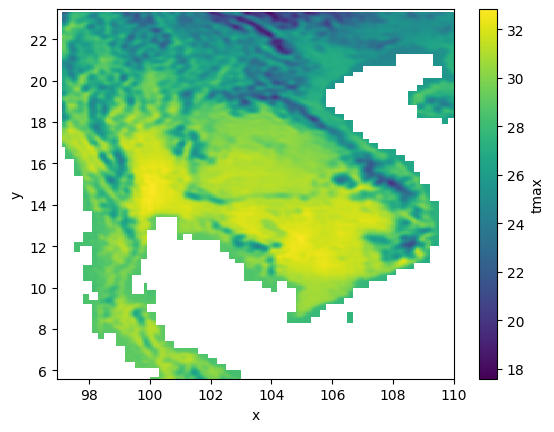

In [2]:
southeastweather.tmax.mean(dim = 'date').plot()

### MAX TEMPERATURE THRESHOLD DAYS

In [3]:
import xclim
#### tmax above a certain temperature
southeastweather.tmax.attrs['units'] = 'degC'
ds = southeastweather.set_index(date="date")
#southeastweather = southeastweather.rename_dims({'date': 'time'})
ds = ds.rename({"date": "time"})
ds
out = xclim.indices.tx_days_above(ds.tmax, thresh="35 degC", freq="MS")

In [5]:
ds.data_vars

Data variables:
    precipitation  (time, y, x) float64 544MB ...
    tmin           (time, y, x) float64 544MB ...
    tmax           (time, y, x) float64 544MB nan nan nan nan ... nan nan nan
    dpt            (time, y, x) float64 544MB ...
    etr            (time, y, x) float64 544MB ...
    vpd            (time, y, x) float64 544MB ...
    hr06           (time, y, x) float64 544MB ...
    hr09           (time, y, x) float64 544MB ...
    hr12           (time, y, x) float64 544MB ...
    hr15           (time, y, x) float64 544MB ...
    hr18           (time, y, x) float64 544MB ...
    srad           (time, y, x) float64 544MB ...
    spatial_ref    int64 8B ...

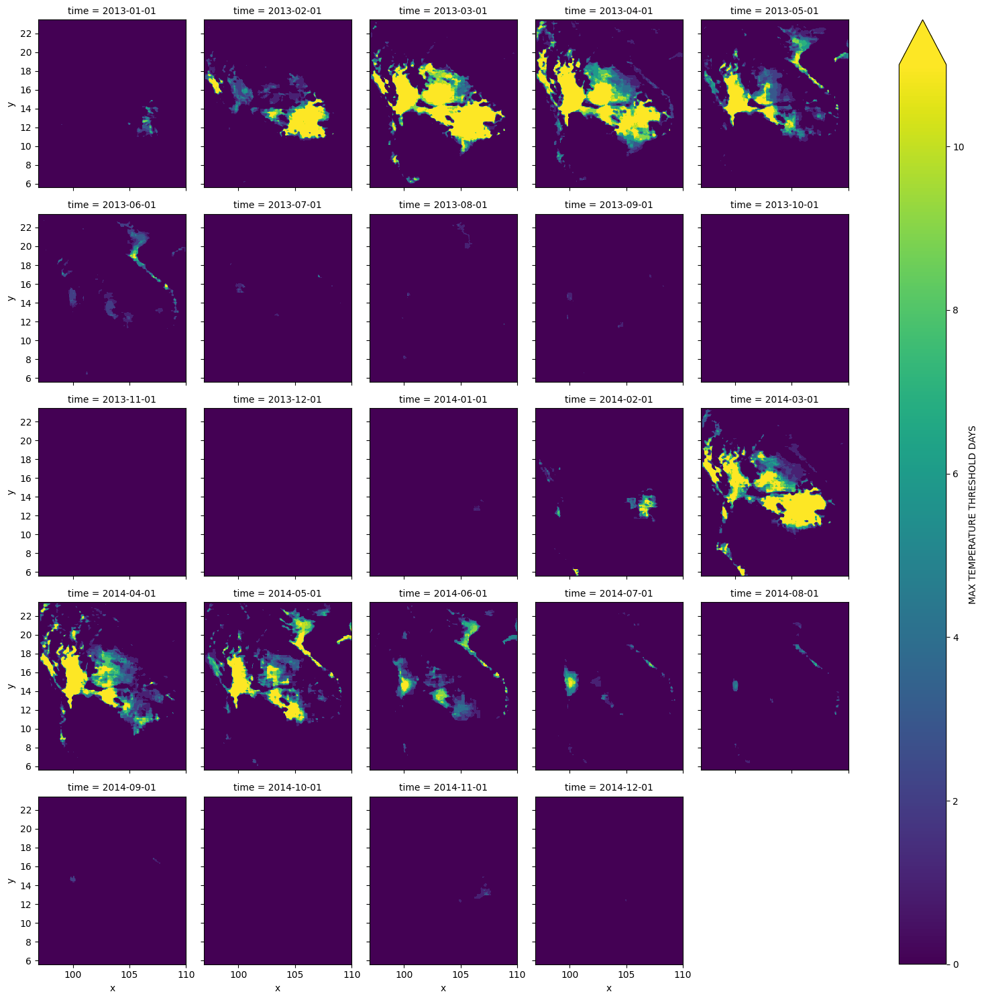

In [4]:

out.plot(
    col="time", 
    col_wrap=5, 
    #cmap="YlGnBu", 
    robust=True, 
    cbar_kwargs={'label': 'MAX TEMPERATURE THRESHOLD DAYS'}
)

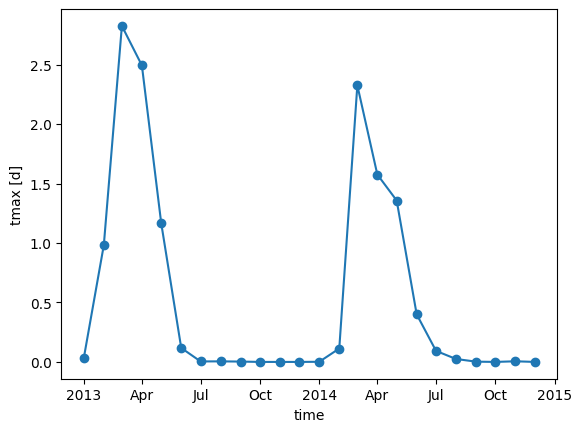

In [ ]:
out.isel(time = 3).plot()
out.mean(dim=['x', 'y']).plot(marker='o', linestyle='-')

### RELATIVE HUMIDITY THRESHOLD DAYS

In [101]:
## RELATIVE HUMIDITY THRESHOLD DAYS

southeastweather.hr09.attrs['units'] = 'degC'
ds = southeastweather.set_index(date="date")
#southeastweather = southeastweather.rename_dims({'date': 'time'})
ds = ds.rename({"date": "time"})
ds
out = xclim.indices.tx_days_above(ds.hr09, thresh="85 degC", freq="MS")

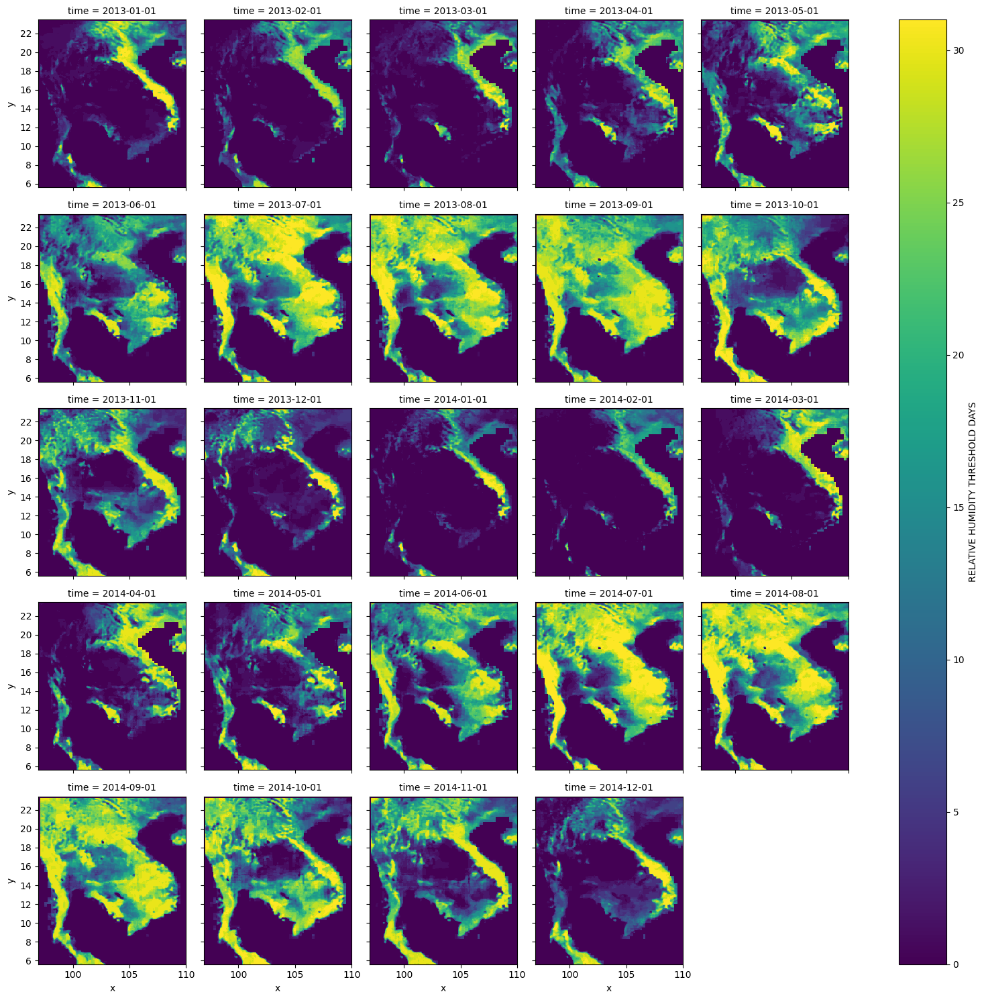

In [102]:

out.plot(
    col="time", 
    col_wrap=5, 
    #cmap="YlGnBu", 
    robust=True, 
    cbar_kwargs={'label': 'RELATIVE HUMIDITY THRESHOLD DAYS'}
)

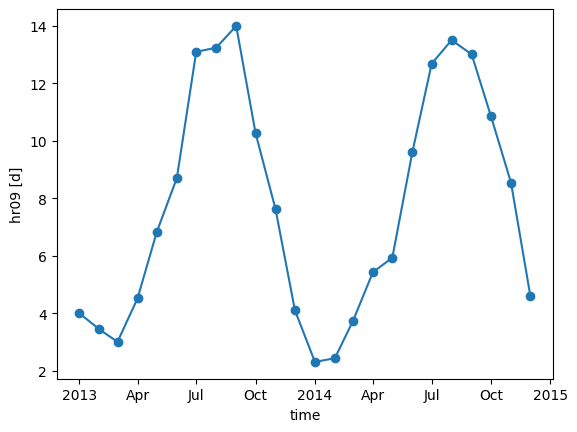

In [51]:
out.mean(dim=['x', 'y']).plot(marker='o', linestyle='-')

### PRECIPITATION INTENSITY-DURATION


In [104]:
## PRECIPITATION INTENSITY-DURATION

# Highest precipitation amount cumulated over a n-day moving window.
#Calculate the n-day rolling sum of the original daily total precipitation series and determine the maximum value over each period.

ds = southeastweather.set_index(date="date")
#southeastweather = southeastweather.rename_dims({'date': 'time'})
ds = ds.rename({"date": "time"})
ds.precipitation.attrs['units'] = 'mm/d'
out = xclim.indices.max_n_day_precipitation_amount(ds.precipitation, window=15, freq="MS")

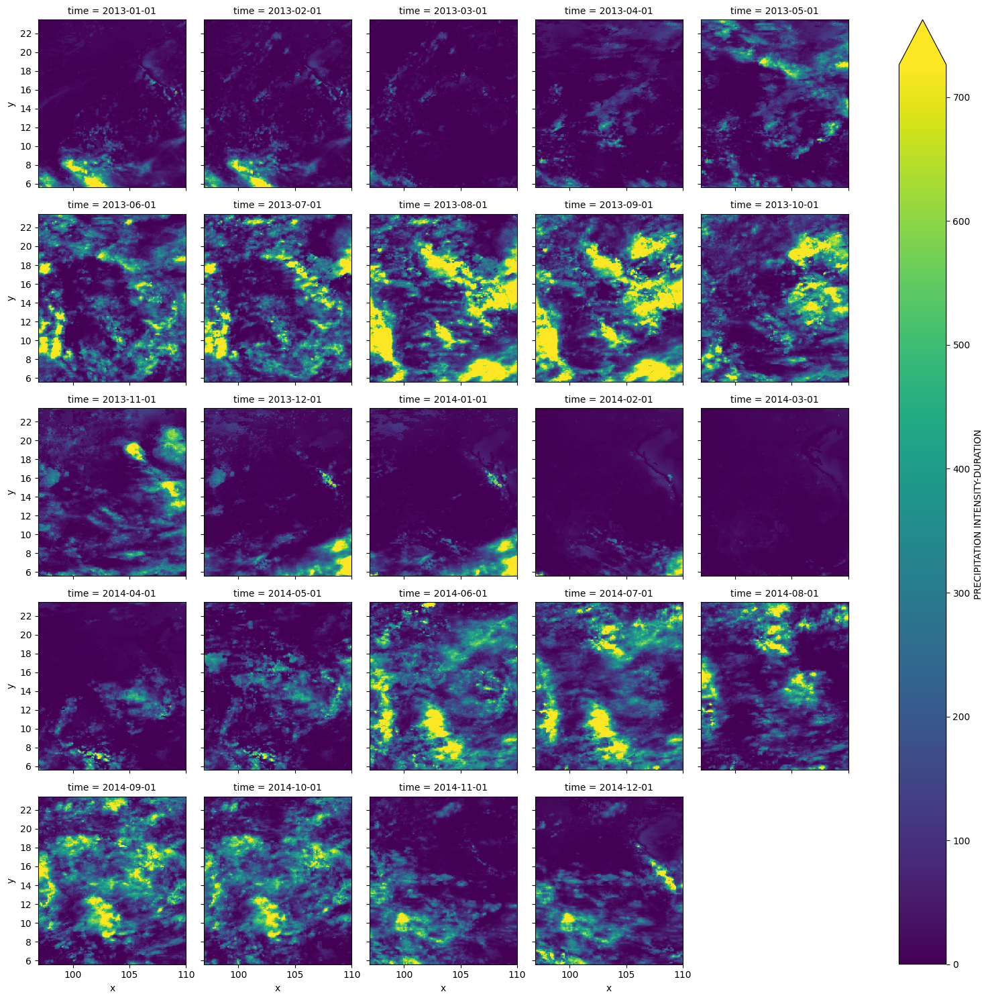

In [105]:

out.plot(
    col="time", 
    col_wrap=5, 
    #cmap="YlGnBu", 
    robust=True, 
    cbar_kwargs={'label': 'PRECIPITATION INTENSITY-DURATION'}
)

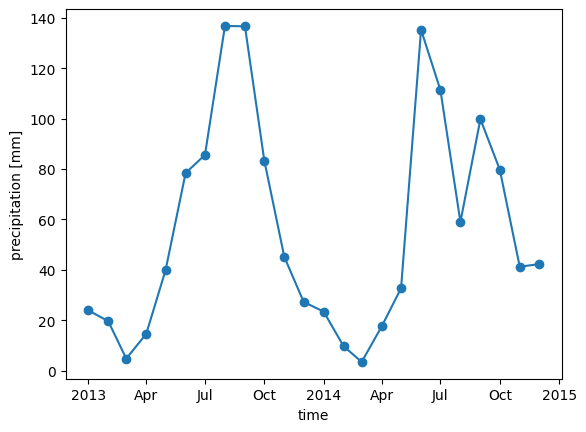

In [66]:
out.mean(dim=['x', 'y']).plot(marker='o', linestyle='-')

In [ ]:
climate_data.temperature.isel(data = 0)

### maximum_consecutive_dry_days

In [11]:
ds = southeastweather.set_index(date="date")
#southeastweather = southeastweather.rename_dims({'date': 'time'})
ds = ds.rename({"date": "time"})
ds.precipitation.attrs['units'] = 'mm/d'

out = xclim.indices.maximum_consecutive_dry_days(ds.precipitation, thresh='1 mm/day', freq='QS')


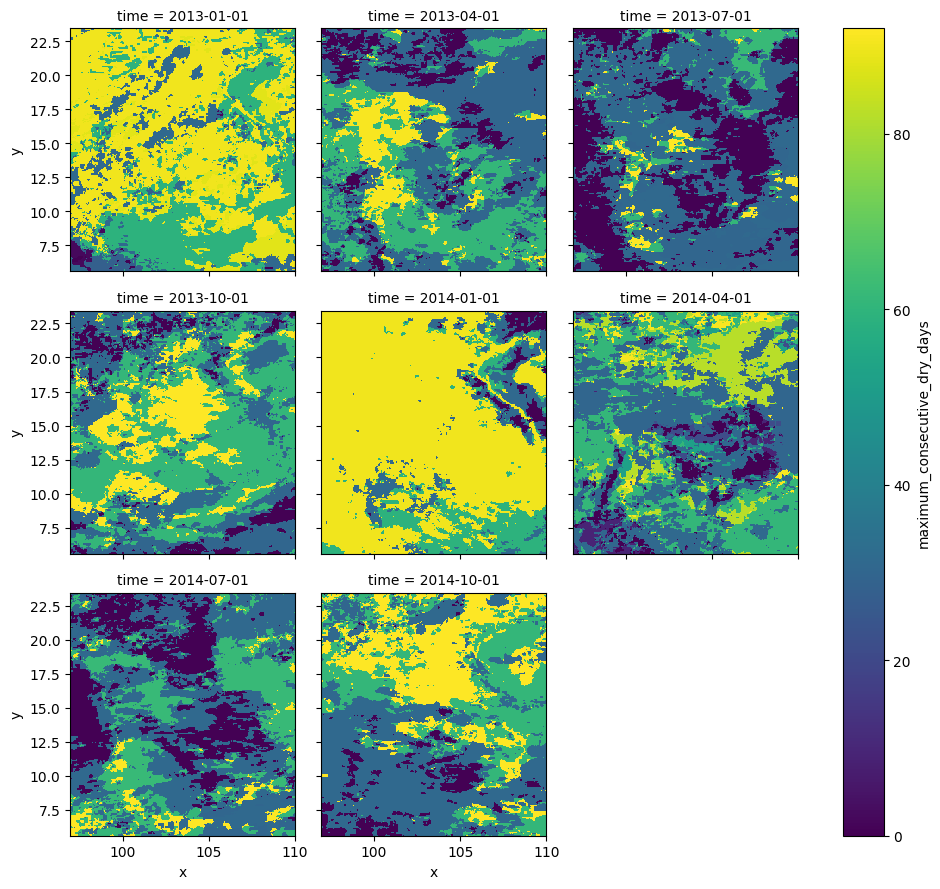

In [91]:

out.plot(
    col="time", 
    col_wrap=3, 
    #cmap="YlGnBu", 
    robust=True, 
    cbar_kwargs={'label': 'maximum_consecutive_dry_days'}
)

### PRECIPITATION INTENSITY-DURATION

In [73]:
out = xclim.indices.max_n_day_precipitation_amount(
    ds.precipitation, 
    window=45, 
    freq="QS"
)

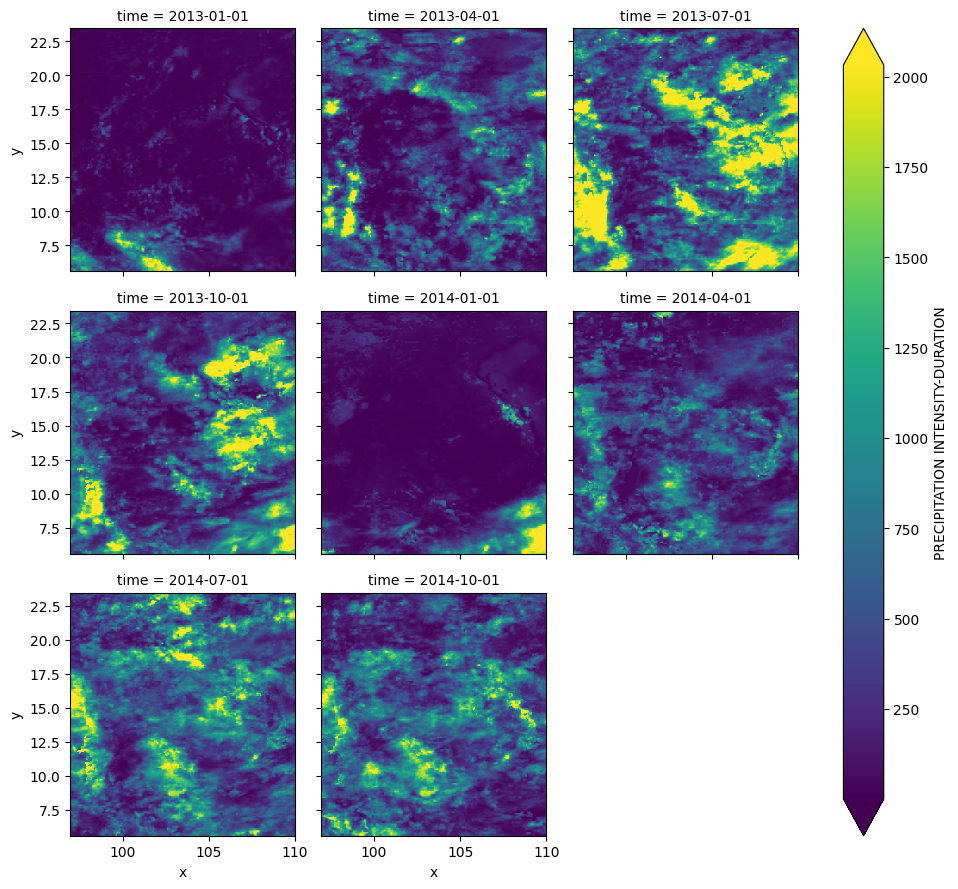

In [89]:

out.plot(
    col="time", 
    col_wrap=3, 
    #cmap="YlGnBu", 
    robust=True, 
    cbar_kwargs={'label': 'PRECIPITATION INTENSITY-DURATION'}
)

In [75]:
ds

<xarray.Dataset> Size: 5GB
Dimensions:        (time: 730, y: 357, x: 261)
Coordinates:
  * time           (time) datetime64[ns] 6kB 2013-01-01 ... 2014-12-31
  * y              (y) float64 3kB 23.42 23.37 23.32 23.27 ... 5.725 5.675 5.625
  * x              (x) float64 2kB 96.98 97.03 97.08 97.13 ... 109.9 109.9 110.0
Data variables:
    precipitation  (time, y, x) float64 544MB 0.0 0.0 0.0 ... 1.552 2.078 2.302
    tmin           (time, y, x) float64 544MB ...
    tmax           (time, y, x) float64 544MB ...
    dpt            (time, y, x) float64 544MB ...
    etr            (time, y, x) float64 544MB ...
    vpd            (time, y, x) float64 544MB ...
    hr06           (time, y, x) float64 544MB ...
    hr09           (time, y, x) float64 544MB ...
    srad           (time, y, x) float64 544MB ...
    spatial_ref    int64 8B ...
Attributes:
    width:      261
    height:     357
    transform:  [ 5.00000007e-02  0.00000000e+00  9.69500041e+01  0.00000000e...
    crs:        EPSG:4326

### DISEASE PRESSURE INDEX

In [85]:



ds = southeastweather.set_index(date="date")
ds.hr09.attrs['units'] = 'degC'
#southeastweather = southeastweather.rename_dims({'date': 'time'})
ds = ds.rename({"date": "time"})

rh_days = xclim.indices.tx_days_above(ds.hr09, thresh="85 degC", freq="QS")

#rh_days = xclim.indices.generic.threshold_count(ds.hr09, threshold="85 %", freq="YS", op=">")

# Precip_intensity (SDII): Avg precip on wet days
ds.precipitation.attrs['units'] = 'mm/d'
precip_intensity = xclim.indices.daily_pr_intensity(ds.precipitation, freq="QS")

# VPD_mean: Average Vapor Pressure Deficit
# Assuming vpd is in hPa or kPa; xclim likes kPa for VPD
vpd_mean = ds.vpd.resample(time="QS").mean()

# 2. Normalization Function (Min-Max scaling 0 to 1)
def normalize(da):
    return (da - da.min()) / (da.max() - da.min())

# 3. Apply Normalization
rh_norm = normalize(rh_days)
pi_norm = normalize(precip_intensity)
vpd_norm = normalize(vpd_mean)

# 4. Calculate DPI
# We add a tiny epsilon (1e-6) to the denominator to avoid division by zero 
# if vpd_norm happens to be 0 in some pixels.
dpi = (rh_norm * pi_norm) / (vpd_norm + 1e-6)

# Add metadata for plotting
dpi.attrs['long_name'] = "Drought/Precipitation Intensity Index"
dpi.attrs['units'] = '1'

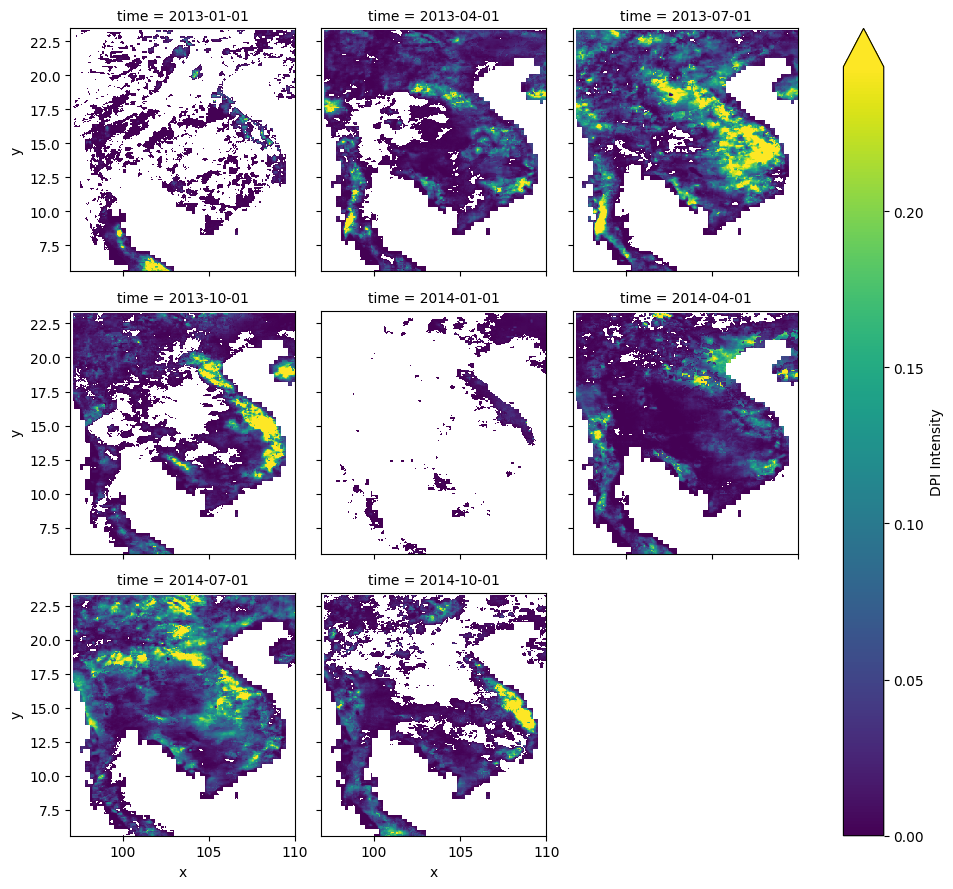

In [87]:

dpi.plot(
    col="time", 
    col_wrap=3, 
    #cmap="YlGnBu", 
    robust=True, 
    cbar_kwargs={'label': 'DPI Intensity'}
)

### GROWING DEGREE DAYS

In [ ]:
tas = (ds.tmax + ds.tmin) / 2
tas.attrs['units'] = 'degC'

gdd = xclim.atmos.growing_degree_days(tas = tas, thresh= '15 degC', freq="QS")

c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\xclim\core\cfchecks.py:77: UserWarning: Variable does not have a `cell_methods` attribute.
  _check_cell_methods(getattr(vardata, "cell_methods", None), data["cell_methods"])
c:\Users\AndresAguilar\AppData\Local\miniconda3\envs\ml\Lib\site-packages\xclim\core\cfchecks.py:79: UserWarning: Variable does not have a `standard_name` attribute.
  check_valid(vardata, "standard_name", data["standard_name"])


In [100]:
ds.data_vars


Data variables:
    precipitation  (time, y, x) float64 544MB 0.0 0.0 0.0 ... 1.552 2.078 2.302
    tmin           (time, y, x) float64 544MB ...
    tmax           (time, y, x) float64 544MB ...
    dpt            (time, y, x) float64 544MB ...
    etr            (time, y, x) float64 544MB ...
    vpd            (time, y, x) float64 544MB ...
    hr06           (time, y, x) float64 544MB ...
    hr09           (time, y, x) float64 544MB ...
    srad           (time, y, x) float64 544MB ...
    spatial_ref    int64 8B ...

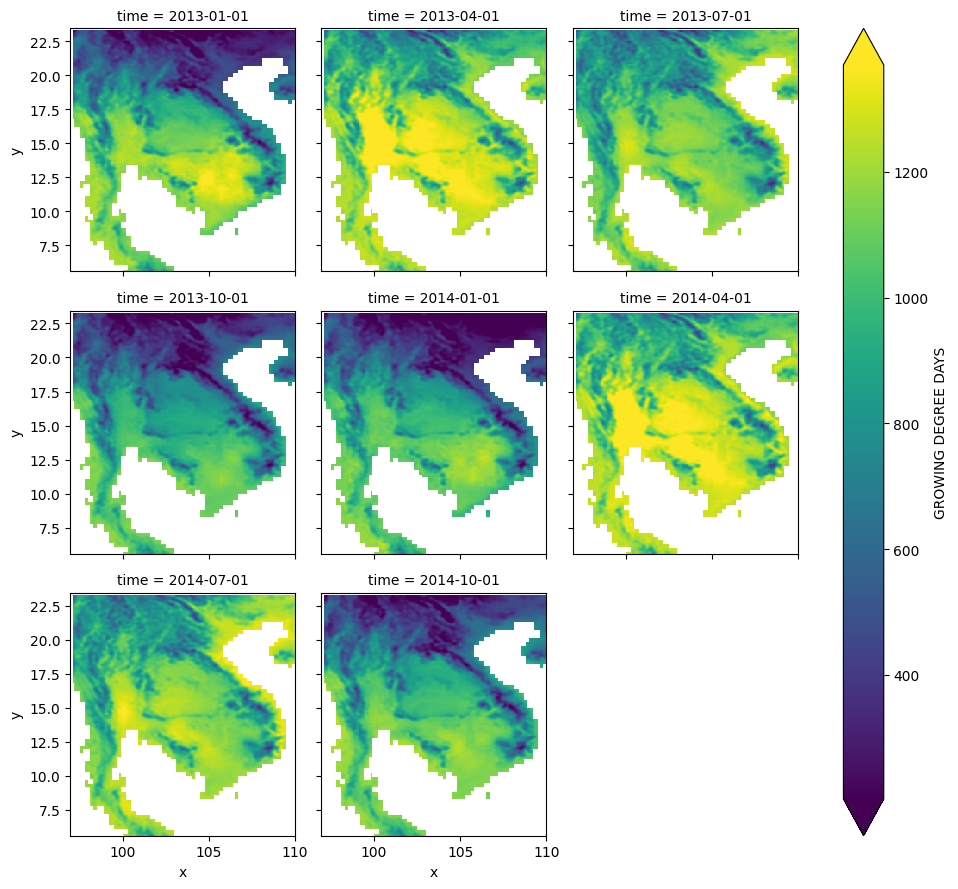

In [95]:

gdd.plot(
    col="time", 
    col_wrap=3, 
    #cmap="YlGnBu", 
    robust=True, 
    cbar_kwargs={'label': 'GROWING DEGREE DAYS'}
)

###   

In [7]:
rh_vars = ['hr06', 'hr09', 'hr12', 'hr15', 'hr18']

# 2. Combine them into a single temporary dimension for calculation
# We'll call the new dimension 'hour_snapshots'
rh_combined = xarray.concat([southeastweather[v] for v in rh_vars], dim='hour_snapshots')

In [9]:
is_high_rh = (rh_combined > 90)

daily_hhi = (is_high_rh.sum(dim='hour_snapshots') / 5) * 100

In [10]:
daily_hhi

<xarray.DataArray 'hr06' (date: 730, y: 357, x: 261)> Size: 544MB
array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
...
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]], shape=(730, 357, 261))
Coordinates:
  * date     (date) datetime64[ns] 6kB 2013-01-01 2013-01-02 ... 2014-12-31
  * y        (y) float64 3kB 23.42 23.37 23.32 23.27 ... 5.775 5.725 5.675 5.625
  * x        (x) float64 2kB 96.98 97.03 97.08 97.13 ... 109.8 109.9 109.9 110.0
Attributes:
    grid_mapping:  spatial_ref

## Creating frequency

In [54]:
gpdf = gpd.read_file('outputs/spatial_data/spatial_data.shp')

gs_df_proj = gpdf.to_crs('ESRI:54052')

#gs_df_proj['distance'] = gs_df_proj.geometry.distance(gs_df_proj.geometry.shift())

## extracting year

gs_df_proj['year'] = gs_df_proj['collection'].apply(lambda x: int(str(x)[:4]))

## unique coordinates

gs_df_proj['unique_id'] = gs_df_proj.apply(lambda x: str(x['longitude']) + '_' + str(x['latitude']) + '_' + str(x['collection']), axis=1)
gs_df_proj['unique_coordinates'] = gs_df_proj.apply(lambda x: str(x['longitude']) + '_' + str(x['latitude']), axis=1)

gs_df_proj_unique = gs_df_proj.drop_duplicates(subset=['unique_id'])
gs_df_proj_unique_coord = gs_df_proj.drop_duplicates(subset=['unique_coordinates'])
gs_df_proj_unique.to_parquet('outputs/spatial_data/spatial_data_unique_collection_coords.parquet')

In [66]:
gs_df_proj_unique['visual_symptom_frequency'] = 0.0
print(gs_df_proj.columns)
## calculate visual symptoms frequency
for value, subs in gs_df_proj_unique.groupby('unique_id'):
    subset_all = gs_df_proj.loc[gs_df_proj['unique_id'] == value, ['collection', 'visual_sym']]
    subset_wb = subset_all.loc[subset_all['visual_sym'] == 'P']
    freqdisease = (subset_wb.shape[0]/subset_all.shape[0])*100
    #subset_all['visual_symptom_frequency'] = subset_all.visual_symptom.count()
    gs_df_proj_unique.loc[subs.index, 'visual_symptom_frequency'] = freqdisease

gs_df_proj_unique.to_parquet('outputs/spatial_data/spatial_data_unique_collection_coords.parquet')

Index(['collection', 'lab_code', 'variety', 'visual_sym', 'lab', 'iso3',
       'latitude', 'longitude', 'location_l', 'location_1', 'location_2',
       'geometry', 'year', 'unique_id', 'unique_coordinates'],
      dtype='str')


In [67]:
import numpy as np
from shapely.geometry import box
import rioxarray as rio
import xarray
import geopandas as gpd

climate_data = xarray.open_dataset(f"D:/OneDrive - CGIAR/projects/spatial_files/raster/weather_southeastasia_2013_2014.nc")

data_points = gpd.read_parquet('outputs/spatial_data/spatial_data_unique_collection_coords.parquet')

data_points = data_points.to_crs(climate_data.rio.crs)

da = climate_data.precipitation.isel(date=0)
transform = climate_data.rio.transform()
ny, nx = da.shape

polygons = []
ids = []

for row in range(ny):
    for col in range(nx):
        x_left, y_top = transform * (col, row)
        x_right, y_bottom = transform * (col + 1, row + 1)

        polygons.append(box(x_left, y_bottom, x_right, y_top))
        ids.append(row * nx + col)

grid = gpd.GeoDataFrame(
    {"cell_id": ids},
    geometry=polygons,
    crs=climate_data.rio.crs
)

In [68]:
joined = gpd.sjoin(data_points, grid, predicate="within")

In [69]:
joined

,collection,lab_code,variety,visual_sym,lab,iso3,latitude,longitude,location_l,location_1,location_2,geometry,year,unique_id,unique_coordinates,visual_symptom_frequency,index_right,cell_id
0,20190528,Sakaeo 5-1,CMR-89,N,NaN,THA,13.881389,102.734722,\N,\N,\N,POINT (102.73472 13.88139),2019,102.734722_13.881389_20190528,102.734722_13.881389,0.0,49966,49966
60,20190528,Sakaeo 7-1,CMR-89,N,NaN,THA,13.690833,102.556944,\N,\N,\N,POINT (102.55694 13.69083),2019,102.556944_13.690833_20190528,102.556944_13.690833,0.0,51007,51007
90,20190528,Sakaeo 11-1,CMR-89,N,NaN,THA,13.771389,102.674444,\N,\N,\N,POINT (102.67444 13.77139),2019,102.674444_13.771389_20190528,102.674444_13.771389,0.0,50487,50487
120,20190518,Sakaeo 13-1,R72,N,NaN,THA,14.016389,102.874444,\N,\N,\N,POINT (102.87444 14.01639),2019,102.874444_14.016389_20190518,102.874444_14.016389,0.0,49186,49186
138,20190518,Sakaeo 14-1,CMR-89,N,NaN,THA,14.032778,102.861667,\N,\N,\N,POINT (102.86167 14.03278),2019,102.861667_14.032778_20190518,102.861667_14.032778,0.0,49186,49186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77295,20220907,L10-1,\N,N,NaN,KHM,13.544132,106.680687,Ratanak Kiri,Kun mum,\N,POINT (106.68069 13.54413),2022,106.680687_13.544132_20220907,106.680687_13.544132,0.0,51872,51872
77415,20220907,L13-1,\N,N,NaN,KHM,13.386342,106.059230,Stung Treng,Siembouk,\N,POINT (106.05923 13.38634),2022,106.05923_13.386342_20220907,106.05923_13.386342,0.0,52643,52643
77535,20220907,L15-1,\N,N,NaN,KHM,12.572239,106.087190,Kratie,Cheut Borey,\N,POINT (106.08719 12.57224),2022,106.08719_12.572239_20220907,106.08719_12.572239,0.0,56819,56819
77655,20220908,L17-1,\N,N,NaN,KHM,12.427537,105.985778,Kratie,Prek Prasob,\N,POINT (105.98578 12.42754),2022,105.985778_12.427537_20220908,105.985778_12.427537,0.0,57600,57600


In [70]:
joined = gpd.sjoin(data_points, grid, predicate="within")

cell_mean = joined.groupby("cell_id")["visual_symptom_frequency"].mean()

result = np.full((ny * nx), np.nan)
result[cell_mean.index] = cell_mean.values

result = result.reshape((ny, nx))


In [79]:
joined['year'] = joined['collection'].astype(str).str[:4].astype(int)
joined_2014 = joined.loc[joined.year == 2014]
joined_2014_ = joined.groupby(['year', 'visual_sym']).size().unstack(fill_value=0)
joined_2014_

visual_sym,N,P
year,,
2013,0,2
2014,152,255
2019,45,0
2020,440,3
2021,677,0
2022,152,3
2023,1,0


In [71]:
cell_summary = joined.groupby(["cell_id", "collection"]).agg({
    "visual_symptom_frequency": "mean",
    "geometry": "first"  
})

cell_summary = gpd.GeoDataFrame(cell_summary, geometry="geometry", crs=joined.crs)

In [82]:
cell_summary.reset_index().to_parquet('outputs/spatial_data/spatial_data_unique_collection_coords_gridcell.parquet')
np.sum(cell_summary.values == 0), cell_summary.shape

(np.int64(980), (1311, 2))

In [38]:
#cell_summary.reset_index().to_file('outputs/spatial_data/spatial_data_unique_perweather_cell.shp')
np.sum(cell_mean.values == 0), cell_mean.shape


(np.int64(416), (716,))

(array([1105.,   58.,   38.,   32.,   11.,   21.,    8.,   19.,   11.,
           8.]),
 array([  0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.,  90., 100.]),
 <BarContainer object of 10 artists>)

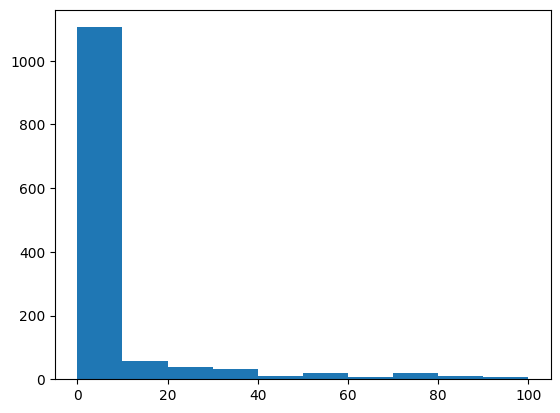

## Functions

In [ ]:
## functions and packages
import operator
from datetime import datetime, timedelta
import pandas as pd
import matplotlib.pyplot as plt
import math

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import xarray
from xclim.indices import run_length

import xclim

def normalize(da):
    return (da - da.min()) / (da.max() - da.min())

def calculate_meteorological_summaries(xrdata, summaries_config):

    summaries_xr = {}

    mean_summary_vars = ['temp_avg', 'hr_avg', 'hr06_avg', 'hr09_avg', 'hr12_avg', 'hr15_avg', 'hr18_avg', 'dewtemp_avg', 'vpd_avg', 'etr_avg', 'srad_avg']
    for k, v in summaries_config.items():
      var_name = v
      if '_avg' in k:
        summaries_xr[k] = getattr(xrdata[var_name], "mean")(dim="time", keep_attrs=True)
      if '_accum' in k:
        var_name = v
        summaries_xr[k] = xrdata[var_name].sum(dim="time", keep_attrs=True)

    for key, value in summaries_xr.items():
        if isinstance(value, xarray.Dataset):
            nombre_var_interna = list(value.data_vars)[0]
            summaries_xr[key] = value[nombre_var_interna]

    summaries_ds = xarray.Dataset(summaries_xr)

    if "dtd_monthly" in summaries_config:
        var_tmax, var_tmin = summaries_config["dtd_monthly"]

        collection_date = pd.to_datetime(xrdata.time.values.max())

        range_days = pd.Index(xrdata.time.values) - pd.to_datetime(collection_date)
        partial_monthlydates = np.arange(-180, 1, 30)

        dtd = (xrdata[var_tmax] + xrdata[var_tmin])
        dtd = dtd.assign_coords(monthly=("time", range_days.days))

        dtd_monthly = dtd.groupby_bins('monthly', bins=partial_monthlydates).mean()
        dtd_monthly.coords['monthly_bins'] = [f"dtd_m{i+1}" for i in range(len(dtd_monthly.monthly_bins))]
        dtd_vars_ds = dtd_monthly.to_dataset(dim='monthly_bins')
        dtd_vars_ds = dtd_monthly.to_dataset(dim='monthly_bins')

        summaries_ds = xarray.merge([summaries_ds, dtd_vars_ds])

    return summaries_ds

def get_avg_spell_length(precip_1d, threshold=1.0, window=5, cond_op='>=', window_op='>='):

    ops = {
      '>': operator.gt,
      '<': operator.lt,
      '>=': operator.ge,
      '<=': operator.le,
      '==': operator.eq
    }

    mask = ops[cond_op](precip_1d,threshold)
    padded = np.pad(mask, (1, 1), mode='constant', constant_values=False)
    
    diffs = np.diff(padded.astype(int))
    starts = np.where(diffs == 1)[0]
    ends = np.where(diffs == -1)[0]
    
    lengths = ends - starts
    
    valid_lengths = lengths[ops[window_op](lengths,window)]
    
    if len(valid_lengths) > 0:
        return np.mean(valid_lengths)
    else:
        return np.nan

def calculate_indices(xrdata , climate_indices):

  climate_indices_xr = {}

  if "vpd_lt_20" in climate_indices:
    var_name, thresh = climate_indices["vpd_lt_20"]
    climate_indices_xr["vpd_lt_20"] = (threshold_days(xrdata[var_name], 1.5, meteorological_var= 'vpd', op = '<=')/len(ds.time))*100

  if "n_vpd_spells" in climate_indices:
    var_name, thresh, window = climate_indices["n_vpd_spells"]
    is_humid = xrdata[var_name] <= thresh
    climate_indices_xr["n_vpd_spells"] = run_length.windowed_run_events(is_humid, window=window, dim="time")

  if "n_wet_spells" in climate_indices:
    var_name, thresh, window = climate_indices["n_wet_spells"]
    is_wet = xrdata[var_name] >= thresh
    climate_indices_xr["n_wet_spells"] = run_length.windowed_run_events(is_wet,window=window, dim="time")
  
  if "n_dry_spells" in climate_indices:
    var_name, thresh, window = climate_indices["n_dry_spells"]
    is_wet = xrdata[var_name] < thresh
    climate_indices_xr["n_dry_spells"] = run_length.windowed_run_events(is_wet,window=window, dim="time")
  
  if "avg_wet_spell_duration" in climate_indices:
    var_name, thresh, window = climate_indices["avg_wet_spell_duration"]
    climate_indices_xr["avg_wet_spell_duration"] = xarray.apply_ufunc(
        get_avg_spell_length,   
        xrdata[var_name],             
        kwargs={'threshold': thresh, 'window': window, 'cond_op': '>=', 'window_op': '>='}, 
        input_core_dims=[['time']],  
        output_core_dims=[[]],        
        vectorize=True,             
        dask='allowed',                
        output_dtypes=[float]          
    )

  if "avg_dry_spell_duration" in climate_indices:
    var_name, thresh, window = climate_indices["avg_dry_spell_duration"]
    climate_indices_xr["avg_dry_spell_duration"] =  xarray.apply_ufunc(
        get_avg_spell_length,   
        xrdata[var_name],             
        kwargs={'threshold': thresh, 'window': window, 'cond_op': '<', 'window_op': '>='}, 
        input_core_dims=[['time']],  
        output_core_dims=[[]],        
        vectorize=True,             
        dask='allowed',                
        output_dtypes=[float]          
    )

  if "rh_85_90_days" in climate_indices:
    var_name, thresholds, op_symbols = climate_indices["rh_85_90_days"]
    if isinstance(var_name, list):
      for var in var_name:
        newvarname = f'{var}_85_90_days'
        climate_indices_xr[newvarname] = multiple_threshold_days(xrdata[var], values = thresholds, op_symbols=op_symbols, meteorological_var= 'hr') 
  
  if "tmean_25_30_days" in climate_indices:
    var_name, thresholds, op_symbols = climate_indices["tmean_25_30_days"]
    climate_indices_xr["tmean_25_30_days"] = multiple_threshold_days(xrdata[var_name], values = thresholds, op_symbols=op_symbols, meteorological_var= 'hr') 
    
  if "max_temp_days" in climate_indices:
    var_name, thresh = climate_indices["max_temp_days"]
    maxdaytemp = threshold_days(xrdata[var_name], thresh, meteorological_var= 'temp', op = '>=')
    climate_indices_xr["max_temp_days"] = maxdaytemp

  if "max_hr_days" in climate_indices:
    var_name, thresh = climate_indices["max_hr_days"]
    maxdayhr = threshold_days(xrdata[var_name], thresh, meteorological_var='hr', op='>=')
    climate_indices_xr["max_hr_days"] = maxdayhr

  if "precip_max_15d" in climate_indices:

    var_name = climate_indices["precip_max_15d"]
    pid_15 = xrdata[var_name].rolling(time=15).sum().max(dim='time')
    climate_indices_xr["precip_max_15d"] = pid_15

  if "consecutive_dry_days" in climate_indices:
    var_name, thresh = climate_indices["consecutive_dry_days"]
    consec_dry_days = consecutive_days(xrdata[var_name], value=thresh, meteorological_var='prec', op='<')
    climate_indices_xr["consecutive_dry_days"] = consec_dry_days

  if "growing_degree_days" in climate_indices:
    var_name, tbase = climate_indices["growing_degree_days"]
    gdd = (xrdata[var_name] - tbase).sum(dim='time', keep_attrs=True)
    climate_indices_xr["growing_degree_days"] = gdd

  if "daily_intensity_index" in climate_indices:
    #precipitación promedio que cae en los días que sí llueve (típicamente, días con ≥ 1 mm/día).
    var_name, thresh = climate_indices["daily_intensity_index"]
    dii = xrdata[var_name].where(xrdata[var_name] >= thresh).mean(dim='time', keep_attrs=True)
    climate_indices_xr["daily_intensity_index"] = dii

  if "disease_pressure_index" in climate_indices:
    vpd_var = climate_indices["disease_pressure_index"]

    if "max_hr_days" in climate_indices_xr and "daily_intensity_index" in climate_indices_xr:
        rh_norm = normalize(climate_indices_xr["max_hr_days"])
        pi_norm = normalize(climate_indices_xr["daily_intensity_index"])
        vpd_norm = normalize(xrdata[vpd_var].mean(dim="time", keep_attrs=True))

        disease_pi = ((rh_norm * pi_norm) / vpd_norm).clip(min=0, max=1)
        climate_indices_xr["disease_pressure_index"] = disease_pi
    else:
        None
  for key, value in climate_indices_xr.items():
      if isinstance(value, xarray.Dataset):
          nombre_var_interna = list(value.data_vars)[0]
          climate_indices_xr[key] = value[nombre_var_interna]

  indices_ds = xarray.Dataset(climate_indices_xr)

  return indices_ds

def set_variable_units(xrdata, variable):
    if variable == 'temp':
        unit = 'degC'
    elif variable == 'hr':
        unit = '%'
    elif variable == 'prec':
        unit = 'mm/d'
    elif variable == 'vpd':
        unit = 'kPa' 
            
    xrdata.attrs['units'] = unit
    return xrdata

def consecutive_days(xrclimatedata, value, meteorological_var, op = '>='):
    xrclimatedata = set_variable_units(xrclimatedata, meteorological_var)
    mask = mask_operation(xrclimatedata, op, value, xrclimatedata.attrs['units'])
    return run_length.longest_run(mask, dim='time')


def mask_operation(xrdata, op, value, unit):
  ops = {
      '>': operator.gt,
      '<': operator.lt,
      '>=': operator.ge,
      '<=': operator.le,
      '==': operator.eq
  }

  thresh = xclim.core.units.convert_units_to(str(value) + " " + unit, xrdata)
  return ops[op](xrdata, thresh)


def multiple_threshold_days(xrclimatedata, values, op_symbols, meteorological_var):
    xrclimatedata = set_variable_units(xrclimatedata, meteorological_var)
    mask = xarray.ones_like(xrclimatedata)

    op_symbols = op_symbols if isinstance(op_symbols, list) else list(op_symbols)
    values = values if isinstance(values, list) else list(values)

    for op, v in zip(op_symbols, values):
      mask = mask * mask_operation(xrclimatedata, op, v, xrclimatedata.attrs['units'])

    return mask.sum(dim="time")

def threshold_days(xrclimatedata, value, meteorological_var, op = '>='):
    xrclimatedata = set_variable_units(xrclimatedata, meteorological_var)
    mask = mask_operation(xrclimatedata, op, value, xrclimatedata.attrs['units'])
    return mask.sum(dim="time")


def plot_facet_grid(xrdata, ncols = 3, figsize = None):
    variables = list(xrdata.data_vars)
    n_vars = len(variables)
    nrows = math.ceil(n_vars / ncols)

    if figsize is None: figsize = (ncols * 5, nrows * 4)
    fig, axes = plt.subplots(nrows, ncols, figsize = figsize)
    axes = axes.flatten()

    for i, var_name in enumerate(variables):
        ax = axes[i]


        xrdata[var_name].plot(
            ax=ax,
            robust=True,
            cmap="YlGnBu",
            cbar_kwargs={'label': getattr(xrdata[var_name], 'units', var_name)}
        )
        ax.set_title(var_name.upper())
        ax.axis('off')


    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()


def extracting_using_gpdf(gpdf, xrdata):
    x_coords = [x for x in gpdf.geometry.x]
    y_coords = [y for y in gpdf.geometry.y]

    x_coords = xarray.DataArray(gpdf.geometry.x, dims="z")
    y_coords = xarray.DataArray(gpdf.geometry.y, dims="z")

    xrdata_extracted = xrdata.sel(x=x_coords, y=y_coords, method='nearest')

    df_extracted = xrdata_extracted.to_dataframe().reset_index(drop=True)
    gpdf_withindex = gpdf.reset_index(drop=True)

    return pd.concat([gpdf_withindex, df_extracted], axis=1)


## Merging with indices

In [ ]:

data_points = gpd.read_parquet('outputs/spatial_data/spatial_data_unique_collection_coords_gridcell.parquet')
data_points['year'] = data_points.reset_index()['collection'].astype(str).str[:4].astype(int)
joined_2014 = data_points.loc[data_points.year == 2014]

collection_dates = joined_2014.collection.unique()
collection_dates = [datetime.strptime(str(cld), '%Y%m%d') for cld in collection_dates]



#joined_2014.to_parquet('outputs/spatial_data/spatial_data_unique_collection_coords_gridcell_2014.parquet')

139 (367, 5)


(array([186.,  36.,  37.,  32.,  11.,  19.,   8.,  19.,  11.,   8.]),
 array([  0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.,  90., 100.]),
 <BarContainer object of 10 artists>)

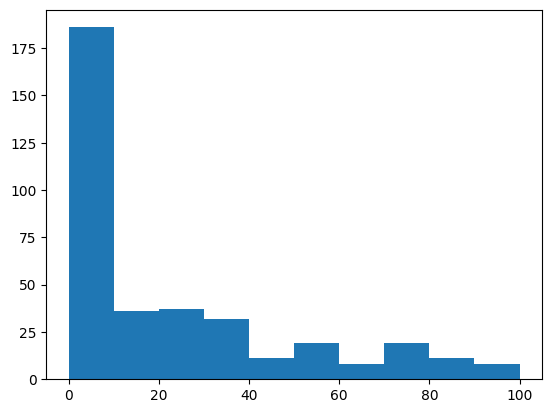

In [5]:
data_points['year'] = data_points.reset_index()['collection'].astype(str).str[:4].astype(int)
joined_2014 = data_points.loc[data_points.year == 2014]
print(np.sum(joined_2014.values == 0), joined_2014.shape)
plt.hist(joined_2014.visual_symptom_frequency.values)

### Climate data

In [ ]:

southeastweather = xarray.open_dataset("D:/OneDrive - CGIAR/projects/spatial_files/raster/weather_southeastasia_2013_2014.nc")




### calculating climate date for one date as an example

In [8]:

st_date = collection_dates[0] - timedelta(days = 179)
colectiondate = southeastweather.sel(date = slice(st_date, collection_dates[0]))

range_days =  pd.Index(colectiondate.date.values) - pd.to_datetime(collection_dates[0])
partial_monthlydates = np.arange(-180, 1, 30)


colectiondate.tmax.attrs['units'] = 'degC'
ds = colectiondate.set_index(date="date")
ds = ds.rename({"date": "time"})
tmean = (ds.tmax + ds.tmin)/2
ds['tmean'] = tmean
dailyhr = ds[[f'hr{i}' for i in ['06','09','12','15','18']]].to_array(dim='hour').mean(dim='hour')
ds['dailyhr'] = dailyhr


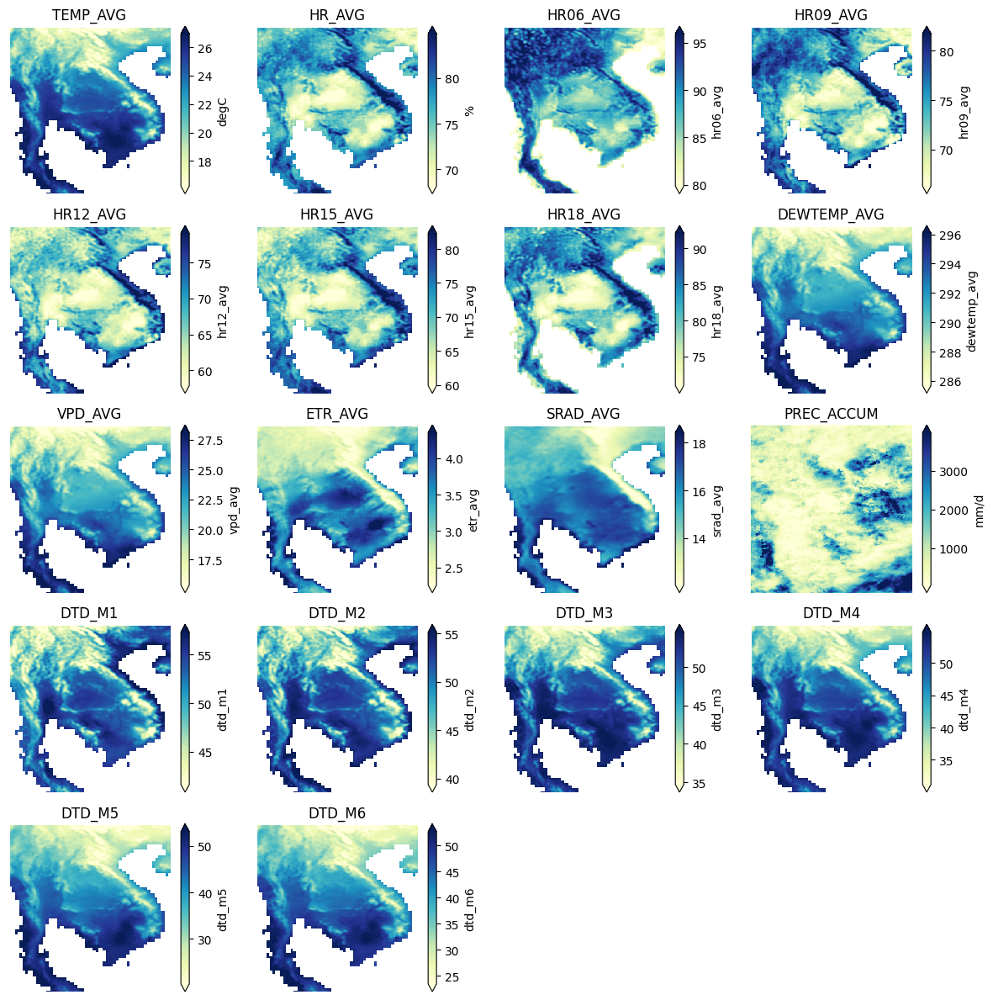

In [ ]:
### climate summary
variables_dict = {
        "temp_avg": ['tmean'],
        "hr_avg": ['dailyhr'],
        "hr06_avg": ['hr06'],
        "hr09_avg": ['hr09'],
        "hr12_avg": ['hr12'],
        "hr15_avg": ['hr15'],
        "hr18_avg": ['hr18'],
        "dewtemp_avg": ['dpt'],
        "vpd_avg": ['vpd'],
        "etr_avg": ['etr'],
        "srad_avg": ['srad'],
        "prec_accum":['precipitation'],
        "dtd_monthly": ['tmax', 'tmin'],
        
}
clima_summary_xarray = calculate_meteorological_summaries(ds , variables_dict)


plot_facet_grid(clima_summary_xarray, ncols=4, figsize = (12,12))

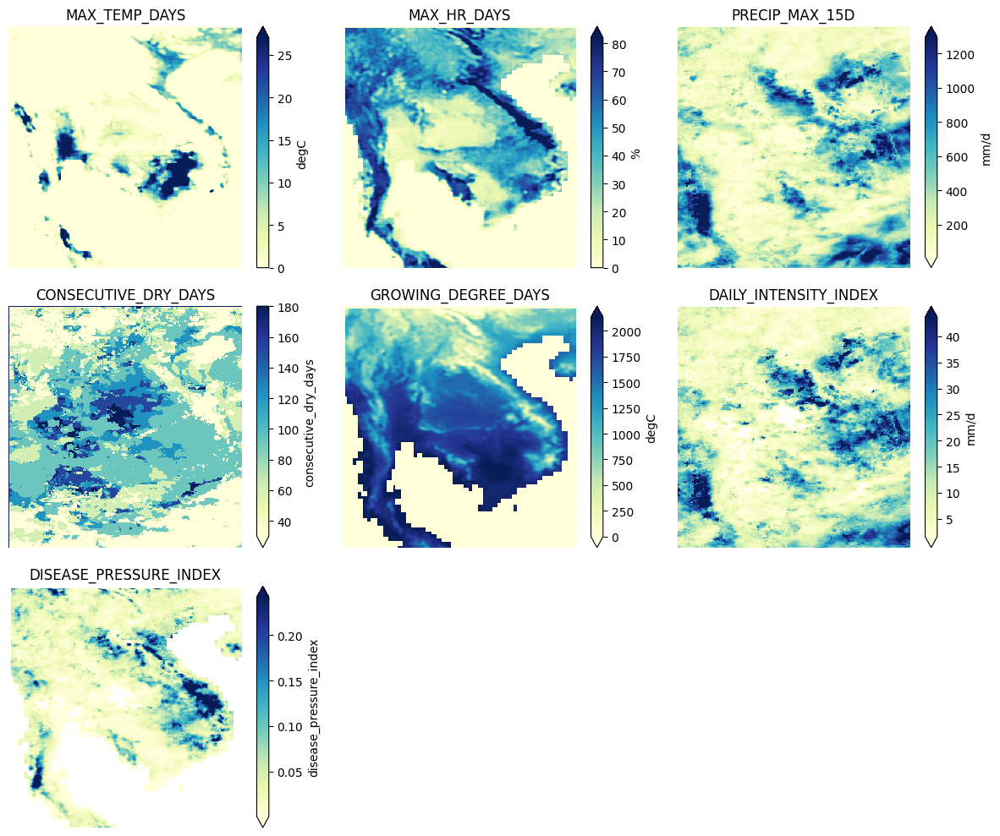

In [ ]:

indices_dict = {
        "max_temp_days": ['tmax', 32],
        "max_hr_days": ['dailyhr', 85],
        "precip_max_15d": ['precipitation'],
        "consecutive_dry_days": ['precipitation', 1.0],
        "growing_degree_days": ['tmean', 15],
        "daily_intensity_index": ['precipitation', 1.0],
        "disease_pressure_index": ['vpd']
}

cl_ind_xarray = calculate_indices(ds , indices_dict)
plot_facet_grid(cl_ind_xarray, ncols=3, figsize=(12,10))

In [69]:
## extracting data using coordinates

climatedata_subset = xarray.merge([clima_summary_xarray, cl_ind_xarray])


joined_2014.collection = joined_2014.collection.map(lambda x: str(x))
datasubset = joined_2014.loc[joined_2014.collection == collection_dates[0].strftime('%Y%m%d')]

extracting_using_gpdf(datasubset, climatedata_subset)



,cell_id,collection,visual_symptom_frequency,geometry,year,y,x,temp_avg,hr_avg,hr06_avg,...,dtd_m4,dtd_m5,dtd_m6,max_temp_days,max_hr_days,precip_max_15d,consecutive_dry_days,growing_degree_days,daily_intensity_index,disease_pressure_index
0,18656,20140131,0.0,POINT (103.20494 19.86381),2014,19.874999,103.225004,19.028391,73.735627,92.979367,...,38.113017,28.729080,31.435664,0,32,69.179814,92.0,725.110396,2.617160,0.009890
1,18917,20140131,0.0,POINT (103.23479 19.839),2014,19.824999,103.225004,18.598726,75.221532,92.692396,...,36.959199,28.009405,30.708227,0,33,131.577215,92.0,647.770750,4.461697,0.022706
2,19191,20140131,0.0,POINT (103.87612 19.78732),2014,19.774999,103.875004,17.728939,80.798098,95.132626,...,34.365825,23.440249,27.836578,0,56,115.917635,92.0,491.208968,4.799851,0.039123
3,23362,20140131,28.0,POINT (103.60512 18.98414),2014,18.974999,103.625004,20.798966,77.050093,88.738137,...,42.367605,33.381979,35.629464,0,52,213.084040,92.0,1043.813890,5.227914,0.027169
4,44805,20140131,50.0,POINT (105.69102 14.88006),2014,14.874999,105.675004,24.182188,75.580241,90.333505,...,49.912650,42.974281,44.300434,0,53,1051.729431,92.0,1652.793859,37.480196,0.159295
5,47412,20140131,0.0,POINT (105.50026 14.36929),2014,14.374999,105.525004,24.762581,76.252817,89.791553,...,51.187212,44.510222,45.934164,0,53,509.635792,92.0,1757.264661,19.088625,0.074483
6,47675,20140131,52.0,POINT (105.64707 14.31659),2014,14.324999,105.625004,24.945780,75.470030,89.229196,...,51.524806,44.878483,46.425156,1,44,557.252140,92.0,1790.240345,24.377444,0.079016


### Extracting data for all data collections


In [9]:
### sammary
variables_dict = {
        "temp_avg": ['tmean'],
        "hr_avg": ['dailyhr'],
        "hr06_avg": ['hr06'],
        "hr09_avg": ['hr09'],
        "hr12_avg": ['hr12'],
        "hr15_avg": ['hr15'],
        "hr18_avg": ['hr18'],
        "dewtemp_avg": ['dpt'],
        "vpd_avg": ['vpd'],
        "etr_avg": ['etr'],
        "srad_avg": ['srad'],
        "prec_accum":['precipitation'],
        "dtd_monthly": ['tmax', 'tmin'],
        
}

indices_dict = {
        "max_temp_days": ['tmax', 32],
        "max_hr_days": ['dailyhr', 85],
        "precip_max_15d": ['precipitation'],
        "consecutive_dry_days": ['precipitation', 1.0],
        "growing_degree_days": ['tmean', 15],
        "daily_intensity_index": ['precipitation', 1.0],
        "disease_pressure_index": ['vpd']
}


df_list = []
for i in range(len(collection_dates)):
        date_oi = collection_dates[i]
        print(f'Extracting data for {date_oi}')
        st_date = date_oi - timedelta(days = 179)
        
        colectiondate = southeastweather.sel(date = slice(st_date, date_oi))
        print(pd.Index(colectiondate.date.values))    
        range_days =  pd.Index(colectiondate.date.values) - pd.to_datetime(date_oi)
        partial_monthlydates = np.arange(-180, 1, 30)

        ds = colectiondate.set_index(date="date")
        ds = ds.rename({"date": "time"})
        tmean = (ds.tmax + ds.tmin)/2
        ds['tmean'] = tmean
        dailyhr = ds[[f'hr{i}' for i in ['06','09','12','15','18']]].to_array(dim='hour').mean(dim='hour')
        ds['dailyhr'] = dailyhr
        
        clima_summary_xarray = calculate_meteorological_summaries(ds , variables_dict)
        cl_ind_xarray = calculate_indices(ds , indices_dict)
        climatedata_subset = xarray.merge([clima_summary_xarray, cl_ind_xarray])

        joined_2014.collection = joined_2014.collection.map(lambda x: str(x))
        datasubset = joined_2014.loc[joined_2014.collection == date_oi.strftime('%Y%m%d')]

        df_list.append(extracting_using_gpdf(datasubset, climatedata_subset))


Extracting data for 2014-01-31 00:00:00
DatetimeIndex(['2013-08-05', '2013-08-06', '2013-08-07', '2013-08-08',
               '2013-08-09', '2013-08-10', '2013-08-11', '2013-08-12',
               '2013-08-13', '2013-08-14',
               ...
               '2014-01-22', '2014-01-23', '2014-01-24', '2014-01-25',
               '2014-01-26', '2014-01-27', '2014-01-28', '2014-01-29',
               '2014-01-30', '2014-01-31'],
              dtype='datetime64[ns]', length=180, freq=None)
Extracting data for 2014-02-05 00:00:00
DatetimeIndex(['2013-08-10', '2013-08-11', '2013-08-12', '2013-08-13',
               '2013-08-14', '2013-08-15', '2013-08-16', '2013-08-17',
               '2013-08-18', '2013-08-19',
               ...
               '2014-01-27', '2014-01-28', '2014-01-29', '2014-01-30',
               '2014-01-31', '2014-02-01', '2014-02-02', '2014-02-03',
               '2014-02-04', '2014-02-05'],
              dtype='datetime64[ns]', length=180, freq=None)
Extracting data fo

In [22]:
southeastweather.rio.transform()

Affine(np.float64(0.05000000074505806), np.float64(0.0), np.float64(96.95000412687659),
       np.float64(0.0), np.float64(-0.05000000074505806), np.float64(23.44999945536256))

In [18]:
gpd_data = gpd.GeoDataFrame(
        pd.concat(df_list),
        geometry=pd.concat(df_list).geometry,
        crs=southeastweather.rio.crs
    )
gpd_data.to_parquet('outputs/spatial_data/wbdisease_incidence_2014_withweatherdata.parquet')

<Axes: >

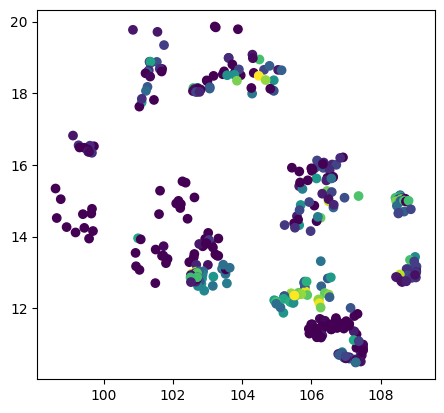

In [17]:
gpd_data.plot(c = gpd_data.visual_symptom_frequency	)

#

In [ ]:
wb_weatherdata[['temp_avg', 'hr_avg', 'hr06_avg', 'hr09_avg', 'hr12_avg',
       'hr15_avg', 'hr18_avg', 'dewtemp_avg', 'vpd_avg', 'etr_avg', 'srad_avg',
       'prec_accum', 'dtd_m1', 'dtd_m2', 'dtd_m3', 'dtd_m4', 'dtd_m5',
       'dtd_m6', 'max_temp_days', 'max_hr_days', 'precip_max_15d',
       'consecutive_dry_days', 'growing_degree_days', 'daily_intensity_index',
       'disease_pressure_index', 'visual_symptom_frequency']]

,temp_avg,hr_avg,hr06_avg,hr09_avg,hr12_avg,hr15_avg,hr18_avg,dewtemp_avg,vpd_avg,etr_avg,...,dtd_m5,dtd_m6,max_temp_days,max_hr_days,precip_max_15d,consecutive_dry_days,growing_degree_days,daily_intensity_index,disease_pressure_index,visual_symptom_frequency
0,19.028391,73.735627,92.979367,70.556493,59.342589,65.384659,80.415027,287.531864,17.213998,2.855057,...,28.729080,31.435664,0,32,69.179814,92.0,725.110396,2.617160,0.009890,0.0
1,18.598726,75.221532,92.692396,72.276701,61.717697,67.763486,81.657382,287.412323,17.034619,2.800643,...,28.009405,30.708227,0,33,131.577215,92.0,647.770750,4.461697,0.022706,0.0
2,17.728939,80.798098,95.132626,78.444876,68.407784,74.209458,87.795745,287.609459,17.401430,2.489829,...,23.440249,27.836578,0,56,115.917635,92.0,491.208968,4.799851,0.039123,0.0
3,20.798966,77.050093,88.738137,74.000471,65.974652,73.146920,83.390282,289.751995,19.786147,2.830924,...,33.381979,35.629464,0,52,213.084040,92.0,1043.813890,5.227914,0.027169,28.0
4,24.182188,75.580241,90.333505,74.185855,65.961835,68.408783,79.011227,292.729175,23.424335,3.554889,...,42.974281,44.300434,0,53,1051.729431,92.0,1652.793859,37.480196,0.159295,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2,26.492378,72.461285,85.774139,68.352960,60.501862,67.044505,80.632961,294.382723,25.496068,4.032285,...,51.156362,55.645225,16,16,203.247402,138.0,2068.627998,9.925224,0.009301,27.0
3,26.371599,72.923113,86.697434,67.401914,60.499064,68.740128,81.277025,294.355131,25.456394,4.023732,...,50.885442,55.332099,14,19,335.758093,138.0,2046.887861,13.031617,0.014929,26.0
4,26.286608,73.520425,86.646398,67.577061,61.832257,69.968497,81.577911,294.449599,25.582073,4.055857,...,50.615725,54.877263,9,22,242.600851,138.0,2031.589394,10.644640,0.013741,2.0
0,26.295525,74.744729,87.591865,70.943467,63.588422,69.411036,82.188855,294.670101,25.984447,3.743850,...,50.346747,52.808362,6,27,260.671492,118.0,2033.194492,12.758512,0.020530,28.0


In [63]:
datasubset

,cell_id,collection,visual_symptom_frequency,geometry,year
41,18656,20140131,0.0,POINT (103.20494 19.86381),2014
42,18917,20140131,0.0,POINT (103.23479 19.839),2014
46,19191,20140131,0.0,POINT (103.87612 19.78732),2014
63,23362,20140131,28.0,POINT (103.60512 18.98414),2014
313,44805,20140131,50.0,POINT (105.69102 14.88006),2014
392,47412,20140131,0.0,POINT (105.50026 14.36929),2014
401,47675,20140131,52.0,POINT (105.64707 14.31659),2014


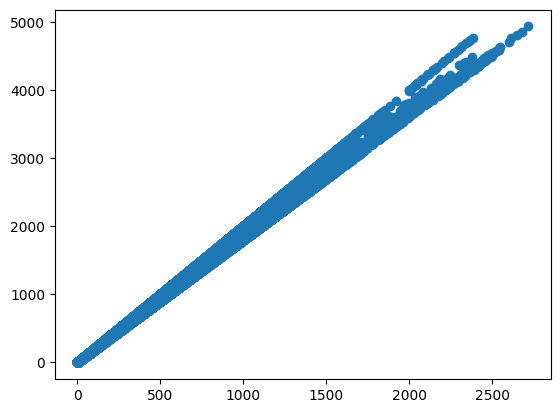

In [102]:
plt.scatter(pid_15.values, pid_30.values)

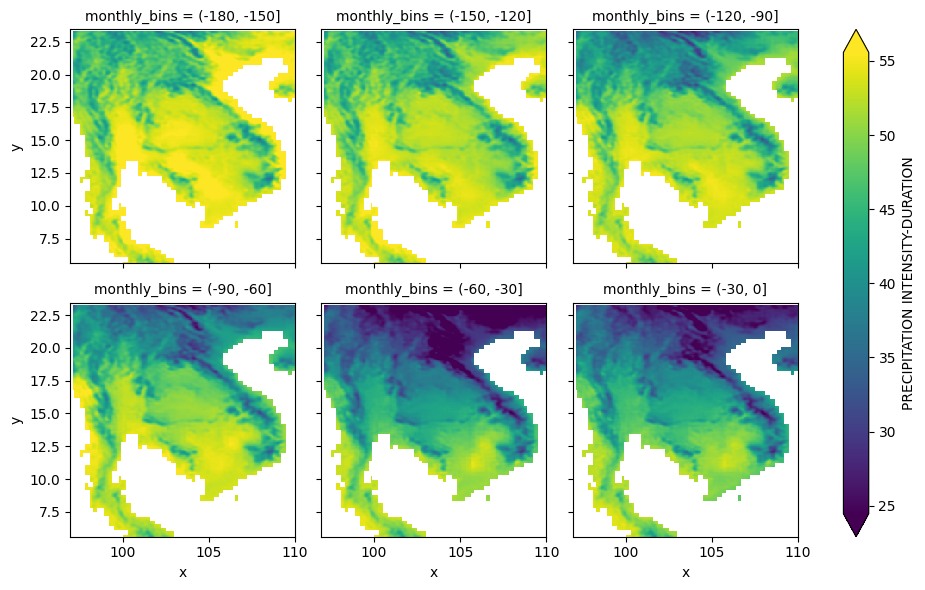

In [89]:

dtd_monthly.plot(
    col="monthly_bins", 
    col_wrap=3, 
    #cmap="YlGnBu", 
    robust=True, 
    cbar_kwargs={'label': 'PRECIPITATION INTENSITY-DURATION'}
)

In [88]:
dtd_monthly

<xarray.DataArray (monthly_bins: 6, y: 357, x: 261)> Size: 4MB
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]], shape=(6, 357, 261))
Coordinates:
  * monthly_bins  (monthly_bins) interval[int64, right] 96B (-180, -150] ... ...
  * y             (y) float64 3kB 23.42 23.37 23.32 23.27 ... 5.725 5.675 5.625
  * x             (x) float64 2kB 96.98 97.03 97.08 97.13 ... 109.9 109.9 110.0
Attributes:
    grid_mapping:  spatial_ref
    units:         degC

In [ ]:
dtd_monthly


Index([-179, -178, -177, -176, -175, -174, -173, -172, -171, -170,
       ...
         -9,   -8,   -7,   -6,   -5,   -4,   -3,   -2,   -1,    0],
      dtype='int64', length=180)

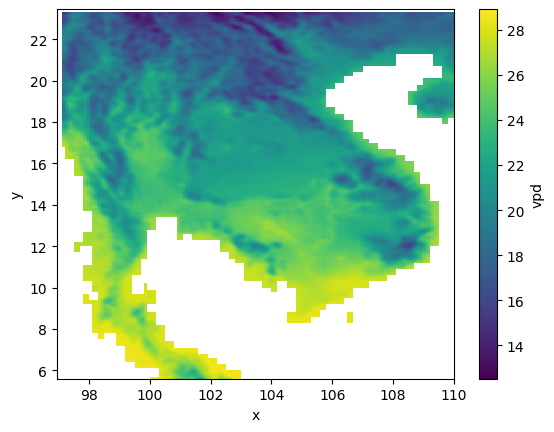

In [59]:
vpd_avg.plot()